# Imports

In [1]:
import numpy as np
import scipy
from PIL import Image
from urllib.request import urlopen

from matplotlib import pyplot as plt

# Function Definitions and Setup

## Importing and preprocessing image


This function imports an image from a URL, converts it to grayscale, resizes it if specified, and returns the image as a NumPy array with pixel values normalized to the range [0, 1]:

In [4]:
def import_image(url, size=None):
    pil_image = Image.open(urlopen(url))
    pil_image = pil_image.convert("L")
    if size is not None:
            pil_image = pil_image.resize((size,size))
    return np.asarray(pil_image)/255   # [0, 255] -> [0, 1]

Image resolution: (682, 1024)


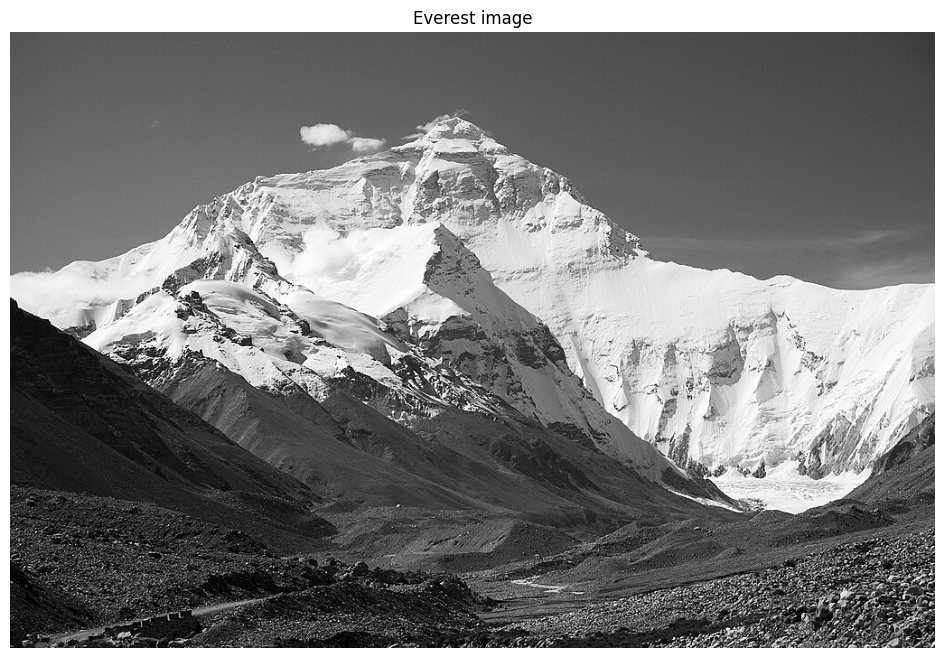

In [5]:
url = "https://upload.wikimedia.org/wikipedia/commons/thumb/e/e7/Everest_North_Face_toward_Base_Camp_Tibet_Luca_Galuzzi_2006.jpg/1024px-Everest_North_Face_toward_Base_Camp_Tibet_Luca_Galuzzi_2006.jpg"

everest_image = import_image(url)

print(f'Image resolution: {everest_image.shape}')

plt.figure(figsize=(16,8))
plt.imshow(everest_image, cmap='gray')
plt.title('Everest image')
plt.axis('off');

## Adding noise

This function adds Gaussian noise to an image with specified mean and standard deviation, and returns the noisy image with pixel values clipped back to the range [0, 1]:

In [6]:
def add_gauss_noise(image, mean=0, sigma=0.1):
    gauss = np.random.normal(mean, sigma, (image.shape))
    noisy = image + gauss
    noisy = np.clip(noisy, 0, 1) # clip back to [0,1]
    return noisy

This function randomly corrupts pixels in an image with salt and pepper noise, setting them to either 0 or 1, based on a specified salt-to-pepper ratio and amount:

In [7]:
def add_sp_noise(image, s_vs_p=0.5, amount=0.05):
    out = np.copy(image)

    num_corrupted_pixels = np.ceil(out.size * amount).astype('int')
    corrupted_pixels_coords = np.random.choice(out.size, num_corrupted_pixels)

    num_salt = np.ceil(num_corrupted_pixels * s_vs_p).astype('int')
    out.reshape(-1)[corrupted_pixels_coords[:num_salt]] = 1
    out.reshape(-1)[corrupted_pixels_coords[num_salt:]] = 0
    return out

## PSNR

The peak signal-to-noise ratio (PSNR) is often used to evaluate the quality of filtering. It is calculated using the expression:
$$
\text{PSNR}(t) = 10\log_{10}\left(\frac{N_x N_y}{\sum_{x, y} (u(\pmb{x},t) - \hat u (\pmb{x}))^2}\right),    
$$
where $u(\pmb{x},t)$ represents the image at the current step, and $\hat u (\pmb{x})$ represents the original non-noisy image. A high PSNR value indicates that the image has been successfully restored to its original state and that the restoration algorithm is working well.

In [8]:
def psnr(original_img, filtered_img):
    return 10*np.log10(original_img.size / (np.sum((filtered_img - original_img)**2)))

## Functions for plotting

In [9]:
def plot_psnr(psnr_set, dt_set, title=None):
    plt.figure(figsize=(10,5))
    LS = ['-', '--', '-.', ':']
    for i in range(len(dt_set)):
        t = np.arange(len(psnr_set[i]))*dt_set[i]
        plt.plot(t, psnr_set[i], label=f'Δt = {dt_set[i]}', linestyle=LS[i])
    plt.legend()
    plt.xlabel("t")
    plt.ylabel("PSNR")
    plt.title(title)
    plt.grid()
    plt.show()

In [10]:
def plot_images(original_image, noisy_image, filtered_images, psnr_set, dt_set, plot_size):
    plt.figure(figsize=plot_size)
    n_subplots = len(dt_set)+2

    plt.subplot(n_subplots, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original image')
    plt.axis('off')

    plt.subplot(n_subplots, 2, 2)
    plt.imshow(noisy_image, cmap='gray')
    plt.title(f'Noisy image, PSNR = {psnr(noisy_image, original_image):.2f}')
    plt.axis('off')


    for i in range(n_subplots-2):
        plt.subplot(n_subplots, 2, i+3)
        plt.imshow(filtered_images[i], cmap='gray')
        plt.title(f'dt = {dt_set[i]}, step = {np.argmax(psnr_set[i])}, PSNR = {max(psnr_set[i]):.2f}')
        plt.axis('off')


    plt.tight_layout()
    plt.show()

In [11]:
def side_by_side_plot(image1, image2, title1, title2):
    plt.figure(figsize=(10,5))

    plt.subplot(1, 2, 1)
    plt.imshow(image1, cmap='gray')
    plt.title(title1)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(image2, cmap='gray')
    plt.title(title2)
    plt.axis('off')
    plt.show()

In [12]:
def plot_intensity_along_axes(image, noisy, filtered, X, Y, title=None):
    plt.figure(figsize=(12,5))

    # Y coordinate is fixed
    plt.subplot(1, 2, 1)
    plt.plot(image[Y,:], color='r', linewidth=0.9, label='Original')
    plt.plot(noisy[Y,:], color='b', linewidth=0.9, label='Noisy', alpha=0.6)
    plt.plot(filtered[Y,:], color='g', linewidth=0.9, label='Filtered')
    plt.xlabel('x')
    plt.legend()
    plt.xlim((0, image.shape[1]))
    plt.ylim((0, 1))
    plt.grid()

    # X coordinate is fixed
    plt.subplot(1, 2, 2)
    plt.plot(image[:,X], color='r', linewidth=0.9, label='Original')
    plt.plot(noisy[:,X], color='b', linewidth=0.9, label='Noisy', alpha=0.6)
    plt.plot(filtered[:,X], color='g', linewidth=0.9, label='Filtered')
    plt.xlabel('y')
    plt.legend()
    plt.xlim((0, image.shape[0]))
    plt.ylim((0, 1))
    plt.grid()

    plt.suptitle(title)
    plt.show

In [13]:
def plot_corr_coef(corr_values):
    plt.figure(figsize=(8,5))
    plt.plot(corr_values, color='k')
    plt.xlabel("step")
    plt.ylabel("Corr. coef.")
    plt.grid()
    plt.show()

In [14]:
def plot_for_decorr(x, y1, y2, z1, z2):
    plt.figure(figsize=(10,9))
    # plt.suptitle(title)

    plt.subplot(2, 1, 1)
    plt.plot(x, y1, label=r"T$_{corr}$", linestyle='--', marker='o', color='r')
    plt.plot(x, y2, label=r"T$_{opt}$", marker='s', color='k')
    plt.xlabel(r"$p$")
    plt.ylabel("Stopping time T")
    plt.legend()
    plt.grid()

    plt.subplot(2, 1, 2)
    plt.plot(x, z1, label=r"PSNR$_{corr}$", linestyle='--', marker='o', color='r')
    plt.plot(x, z2, label=r"PSNR$_{opt}$", marker='s', color='k')
    plt.xlabel(r"$p$")
    plt.ylabel("PSNR")
    plt.legend()
    plt.grid()
    plt.show()

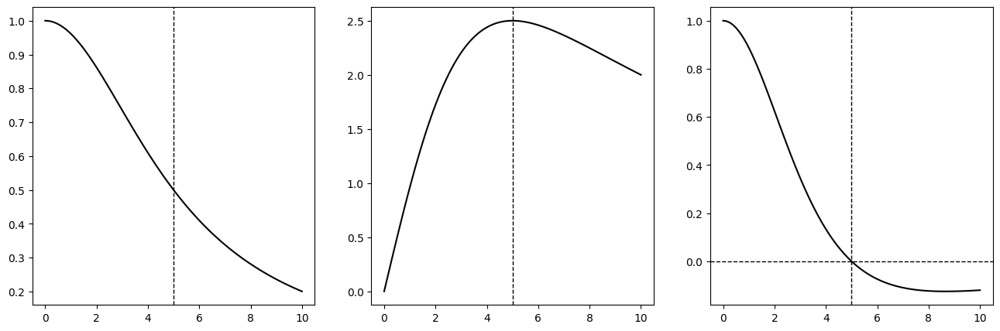

In [15]:
plt.figure(figsize=(16,5))
# plt.suptitle(title)

x = np.linspace(0,10,100)
k = 5

plt.subplot(1, 3, 1)
plt.plot(x, 1/(1+x**2/k**2), color = 'k')
plt.axvline(k, color = 'k', linewidth = 1, linestyle ="--")

plt.subplot(1, 3, 2)
plt.plot(x, x/(1+x**2/k**2), color = 'k')
plt.axvline(k, color = 'k', linewidth = 1, linestyle ="--")

plt.subplot(1, 3, 3)
plt.plot(x, 1/(1+x**2/k**2) - 2*x**2/(1+x**2/k**2)**2/k**2, color = 'k')
plt.axvline(k, color = 'k', linewidth = 1, linestyle ="--")
plt.axhline(0, color = 'k', linewidth = 1, linestyle ="--")

plt.show()

# LBM D2Q5 algorithm

Let's consider the numerical solution of the Perona-Malik equation using the lattice Boltzmann method (LBM). In the general setup of the LBM, the computational domain is discretized into a D$n$Q$b$ lattice with $b$ velocity directions in $n$-dimensional space. The evolution equation of the model is given by:

$$
u_{i}(\pmb{x} + \pmb{c}_{i} \Delta t, t + \Delta t) = u_{i}(\pmb{x}, t) - \frac{1}{\tau} \{ u_{i}(\pmb{x}, t) - u_{i}^{\text{eq}}(\pmb{x}, t) \},
$$

where $i = 0, \ldots, b-1$, $\Delta t$ is the time step, $\pmb{c}_{i}$ is the set of discrete velocities, $\tau$ is the dimensionless relaxation time, and $u_{i}(\pmb{x}, t)$ and $u_{i}^{\text{eq}}(\pmb{x}, t)$ are the distribution function and the equilibrium distribution function, respectively, satisfying the conditions:

$$
\begin{aligned}
& u_{i}^{\text{eq}}(\pmb{x}, t) = \alpha_i u(\pmb{x}, t), \quad \sum_i \alpha_i = 1, \\
& \sum_i u_{i} = \sum_i u_{i}^{\text{eq}} = u, \\
& \sum_i \pmb{c}_{i} u_{i}^{\text{eq}} = 0, \quad \sum_i \pmb{c}_{i} \pmb{c}_{i} u_{i}^{\text{eq}} = c_s^2 u \mathbb{I}.
\end{aligned}
$$

The parameters $\alpha_i$ and $c_s$ are determined by the geometry of the lattice.

In two-dimensional space, the D2Q5 and D2Q9 models are widely used for solving diffusion equations. We use the D2Q5 model because it is more efficient in terms of computational speed compared to the D2Q9, while they produce nearly identical results in image filtering ([Zhang, 2012](https://doi.org/10.1007/s10851-011-0295-x)).

For the D2Q5 model:
$$
\begin{aligned}
\pmb{c}_i & =
\begin{cases}
(0, 0), \;\; i = 0, \\
(\cos[(i-1)\pi/2], \sin[(i-1)\pi/2])c, & i = 1, 2, 3, 4,
\end{cases} \\
c_s^2 & = \frac{2c^2}{5}, \\
\alpha_i & = \frac{1}{5}, \quad i = 0, 1, 2, 3, 4,
\end{aligned}
$$

where $c = \Delta x / \Delta t$. Without loss of generality, we assume the lattice spacing $\Delta x = 1$.

## Computing $\nabla u$

First of all, we need to define the gradient of an image at each step. In the interior region of the image, the gradient $\nabla u(\pmb{x})$ is calculated using the finite difference method:

$$
\nabla u(\pmb{x}) = \frac{1}{2 \Delta t} \sum_{i=1}^4 \pmb{e}_i u(\pmb{x} + \pmb{c}_i \Delta t).
$$

Here, $\pmb{e}_i = \pmb{c}_i / c$ represent the direction vectors.

At the boundaries of the image, adiabatic boundary conditions are used, which means the flux of intensity in the direction normal to the boundary is zero. Consequently, the normal component of the gradient relative to the boundary is also zero. Meanwhile, the tangential component of the gradient is calculated in the same manner as within the image.

In [16]:
kernel_y = np.array([
    [0,-1,0],
    [0,0,0],
    [0,1,0]
])
kernel_x = np.array([
    [0,0,0],
    [1,0,-1],
    [0,0,0]
])

def compute_gradient(u, beta):
    grad = np.array([
        scipy.signal.convolve2d(u[:,:,0], kernel_y, mode='same'),
        scipy.signal.convolve2d(u[:,:,0], kernel_x, mode='same')
    ]).transpose((1,2,0))
    grad[0,:,0] = np.zeros_like(grad[0,:,0])
    grad[-1,:,0] = np.zeros_like(grad[-1,:,0])
    grad[:,0,1] = np.zeros_like(grad[:,0,1])
    grad[:,-1,1] = np.zeros_like(grad[:,-1,1])

    return grad/beta

## Computing $\tau$

In our subsequent experiments, we chose the diffusion coefficient in the form

$$
D(|\nabla u|) = \frac{1}{1+|\nabla u|^2/k^2}.
$$

In LBM D2Q5, the relaxation time $\tau$ is determined by the following equation ([Zhang, 2012](https://doi.org/10.1007/s10851-011-0295-x)):

$$
\tau = \frac{5 \Delta t}{2(1+|\nabla u|^2/k^2)} + \frac{1}{2},
$$

where $k$ is a threshold value which, following the work of [Canny, 1986](https://doi.org/10.1109/TPAMI.1986.4767851), can be set as $k = 0.9 \sum |\nabla u|/(N_x N_y)$, with $N_x N_y$ representing the image size. In this way, $k$ becomes an adaptive parameter that reflects the average noise level for each image.

A sufficient condition for the stability of the LBM equation is the non-negativity of all $u_{i}^{\text{eq}}$ ([Kruger, 2017](https://link.springer.com/book/10.1007/978-3-319-44649-3)). If $\tau > 1/2$, the sign of $u_{i}^{\text{eq}}$ is preserved. From expression \eqref{tau}, it follows that for $\Delta t > 0$, the stability condition is always satisfied. In contrast, a finite difference scheme with $\Delta x = 1$ is stable only within the range $0 < \Delta t \leq 1/4$ ([Perona, 1990](https://doi.org/10.1109/34.56205)).

In [17]:
def compute_tau(grad, gamma, dt):
    mod_grad = np.sqrt(grad[:,:,0]**2 + grad[:,:,1]**2)
    k = 0.9 * np.sum(mod_grad) / mod_grad.size
    tau = gamma * dt  / (1 + (mod_grad/k)**2) + 0.5
    return np.expand_dims(tau, 2)

## Boundary treatment

At the boundary, it is not possible to compute the distribution functions $u_i(\pmb{x}, t)$ that are directed inward into the image for the next step. To estimate these at the boundary, the nonequilibrium extrapolation method ([Zhao, 2002](https://doi.org/10.1088/1009-1963/11/4/310)) is applied. According to this method, the value of the distribution functions at the boundary of the image $u_i(\mathbf{B}, t)$ can be divided into equilibrium and nonequilibrium parts $u_i^{\text{eq}}(\mathbf{B}, t) + u_i^{\text{neq}}(\mathbf{B}, t)$, with $u_i^{\text{neq}}(\mathbf{B}, t)$ approximated by the nonequilibrium part of the nearest internal node $u_i^{\text{neq}}(\mathbf{B}, t) \simeq u_i^{\text{neq}}(\mathbf{N}, t)$. Therefore, it follows that:

$$
u_i(\mathbf{B}, t) = u_i^{\text{eq}}(\mathbf{B}, t) + u_i(\mathbf{N}, t) - u_i^{\text{eq}}(\mathbf{N}, t).
$$

## LBM D2Q5

Now that we have determined all the necessary functions, we are ready to introduce the main function to perform LBM D2Q5 for a specified number of steps (num_steps) with a time step of dt.

In [18]:
def LBM(noisy_image, original_image, dt, num_steps):
    # D2Q5
    alpha_i = np.array([[1/5, 1/5, 1/5, 1/5, 1/5]])
    beta = 2
    gamma = 2.5

    # Initilization
    u = np.expand_dims(noisy_image, 2)
    u_eq_i = u*alpha_i
    u_i = np.copy(u_eq_i)

    psnr_values = [psnr(noisy_image, original_image)]
    psnr_max = 0

    for step in range(num_steps):

        # Compute current gradient and tau
        grad_u = compute_gradient(u, beta)
        tau = compute_tau(grad_u, gamma, dt)

        # Collision
        post_col = u_i - (u_i - u_eq_i)/tau

        # Stream
        # indices denote [y_coordinate, x_coordinate, ith_component]
        u_i[:,:,0] = post_col[:,:,0]
        u_i[:,1:,1] = post_col[:,:-1,1]
        u_i[:-1,:,2] = post_col[1:,:,2]
        u_i[:,:-1,3] = post_col[:,1:,3]
        u_i[1:,:,4] = post_col[:-1,:,4]

        # Boundary treatment for inward-facing distributions
        u_i[:,0,1] = post_col[:,0,1]
        u_i[-1,:,2] = post_col[-1,:,2]
        u_i[:,-1,3] = post_col[:,-1,3]
        u_i[0,:,4] = post_col[0,:,4]

        # New u and u_eq_i
        u = np.sum(u_i, axis=2, keepdims=True)
        u_eq_i = u*alpha_i

        # Remember PSNR values and best image
        psnr_t = psnr(np.clip(u[:,:,0], 0, 1), original_image)
        psnr_values.append(psnr_t)
        if psnr_t > psnr_max:
            psnr_max = psnr_t
            u_best = np.clip(u, 0, 1)

    return psnr_values, u_best

This function runs the LBM with different time step sizes to denoise an image, returning the PSNR values and the best denoised images for each time step:

In [19]:
def run_LBM(noisy_image, original_image, t_end, dt_set):
    psnr_all = []
    best_images = []

    for dt in dt_set:
        num_steps = int(t_end/dt)
        psnr_values, u_best = LBM(noisy_image, original_image, dt, num_steps)
        psnr_all.append(psnr_values)
        best_images.append(u_best)

    return psnr_all, best_images

# Experiments


The following chapter presents the results of LBM D2Q5 denoising on test images. The best pictures (according to PSNR) are compared with the original ones.

## Lenna: gaussian noise

In [ ]:
url = "https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_(test_image).png"

pil_image = Image.open(urlopen(url))
pil_image = pil_image.convert("L").resize((256, 256))
lenna_image = np.asarray(pil_image)/255   # [0, 255] -> [0, 1]

In [ ]:
lenna_gauss = add_gauss_noise(lenna_image, sigma=0.1)

t_end = 10
dt_set = [0.01, 0.1, 0.5, 1]

psnr_lenna_gauss, lenna_gauss_filtered = run_LBM(lenna_gauss, lenna_image, t_end, dt_set)

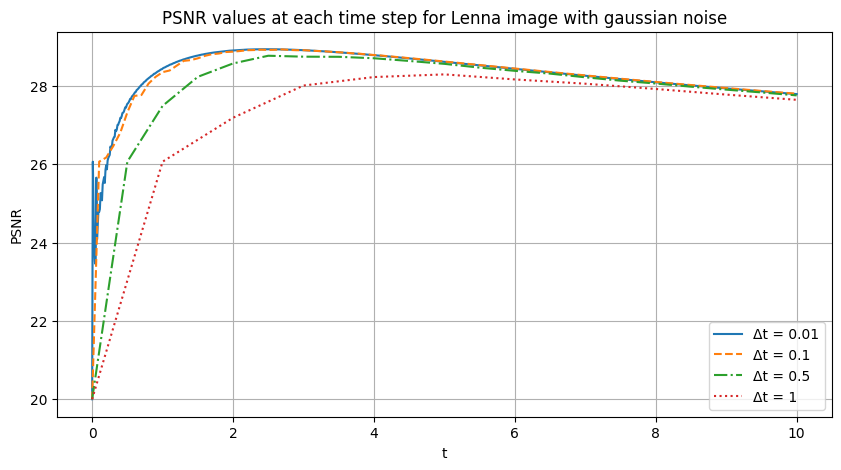

In [ ]:
title = 'PSNR values at each time step for Lenna image with gaussian noise'
plot_psnr(psnr_lenna_gauss, dt_set, title)

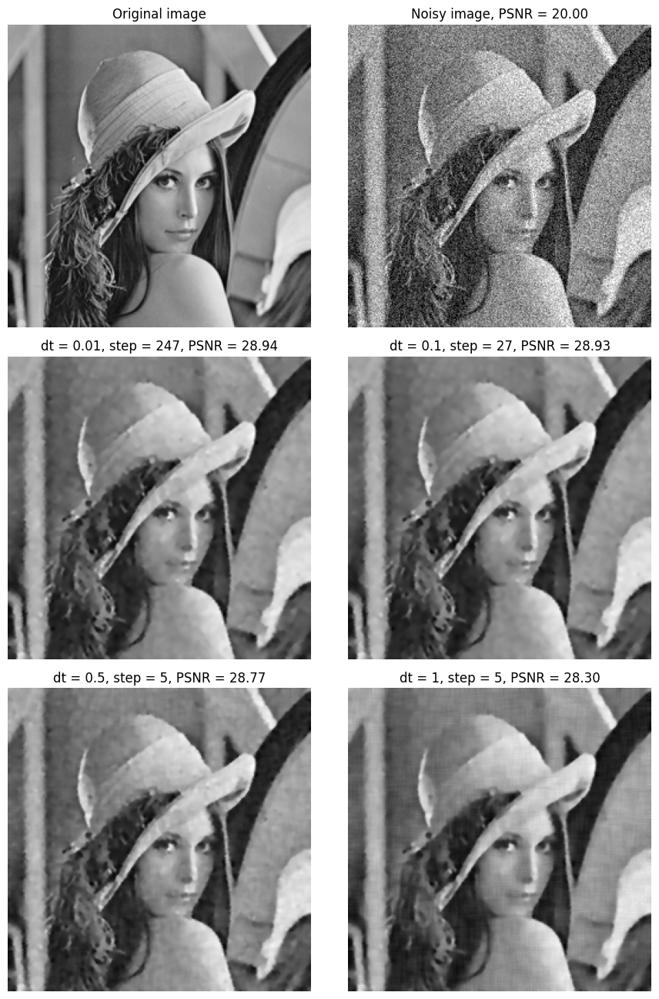

In [ ]:
plot_images(lenna_image, lenna_gauss, lenna_gauss_filtered, psnr_lenna_gauss, dt_set, (9, 26))

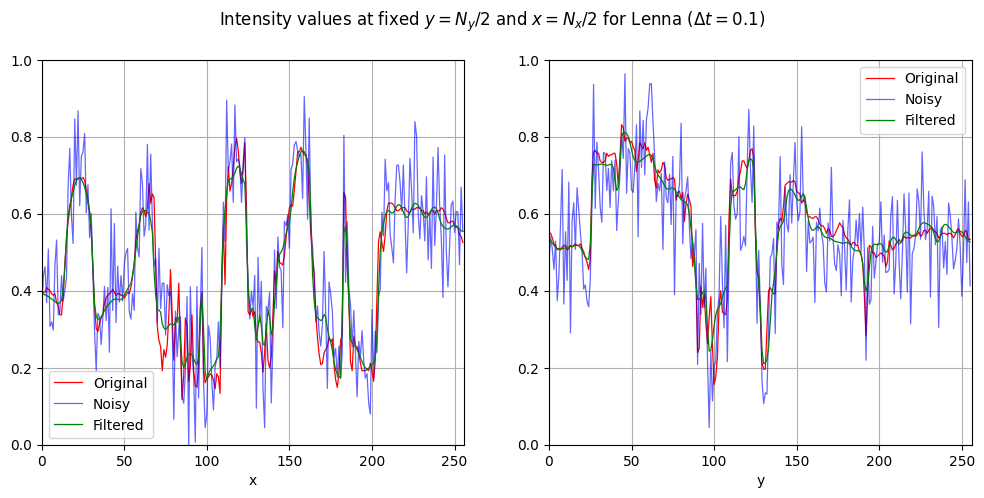

In [ ]:
title = f'Intensity values at fixed $y=N_y/2$ and $x=N_x/2$ for Lenna ($\Delta t = {dt_set[1]}$)'
plot_intensity_along_axes(lenna_image, lenna_gauss, lenna_gauss_filtered[1], 128, 128, title)

In [ ]:
plt.imsave('lenna.png', lenna_image, cmap='gray')
plt.imsave('lenna_gauss.png', lenna_gauss, cmap='gray')
plt.imsave('lenna_gauss_filtered_001.png', np.squeeze(lenna_gauss_filtered[0]), cmap='gray')
plt.imsave('lenna_gauss_filtered_1.png', np.squeeze(lenna_gauss_filtered[3]), cmap='gray')

## Lenna: salt and pepper noise

In [ ]:
lenna_sp = add_sp_noise(lenna_image)

t_end = 10
dt_set = [0.01, 0.1, 0.5, 1]

psnr_lenna_sp, lenna_sp_filtered = run_LBM(lenna_sp, lenna_image, t_end, dt_set)

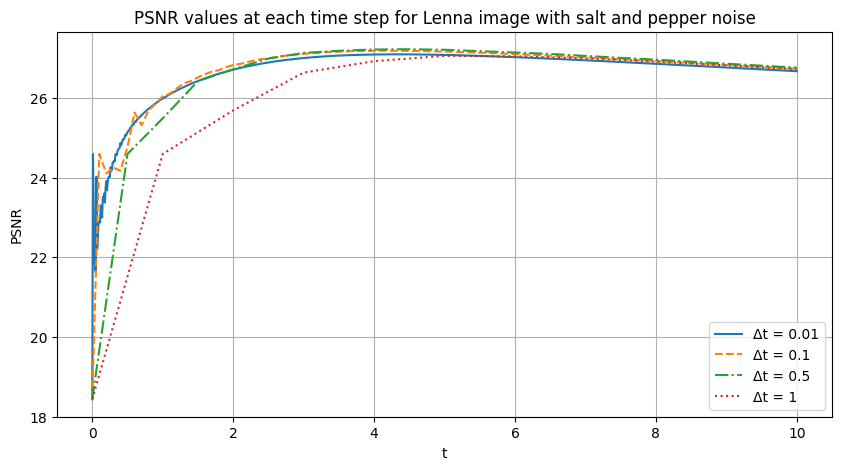

In [ ]:
title = 'PSNR values at each time step for Lenna image with salt and pepper noise'
plot_psnr(psnr_lenna_sp, dt_set, title)

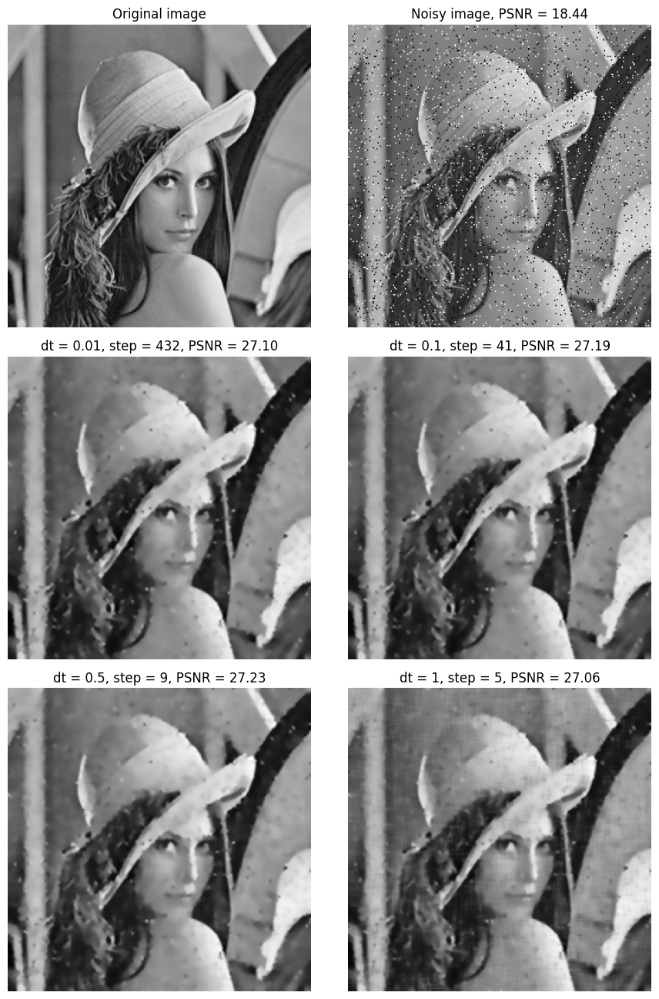

In [ ]:
plot_images(lenna_image, lenna_sp, lenna_sp_filtered, psnr_lenna_sp, dt_set, (9, 26))

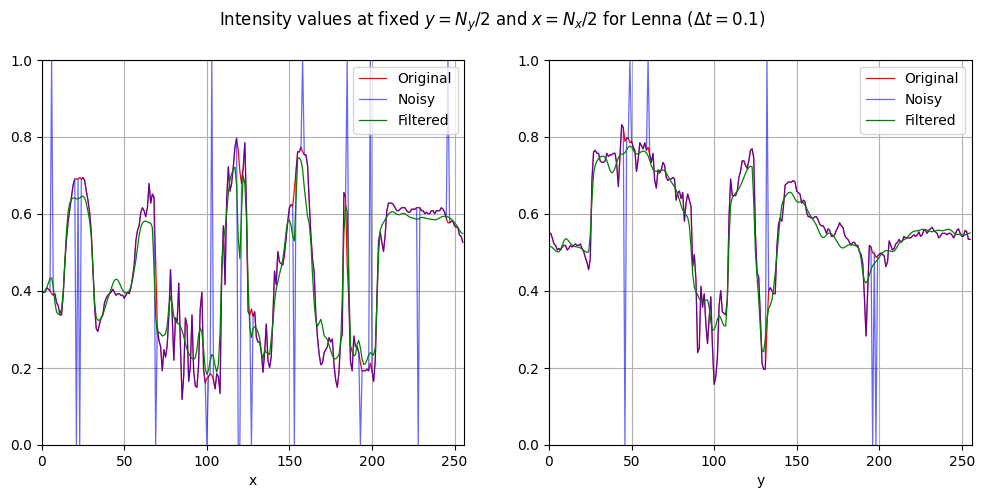

In [ ]:
title = f'Intensity values at fixed $y=N_y/2$ and $x=N_x/2$ for Lenna ($\Delta t = {dt_set[1]}$)'
plot_intensity_along_axes(lenna_image, lenna_sp, lenna_sp_filtered[1], 128, 128, title)

In [ ]:
plt.imsave('lenna_sp.png', lenna_sp, cmap='gray')
plt.imsave('lenna_sp_filtered_001.png', np.squeeze(lenna_sp_filtered[0]), cmap='gray')
plt.imsave('lenna_sp_filtered_1.png', np.squeeze(lenna_sp_filtered[3]), cmap='gray')

## Synthetic images: gaussian noise

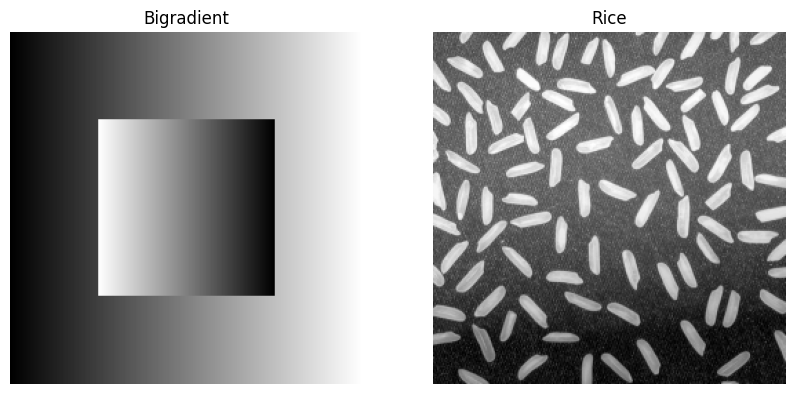

In [ ]:
url_bigrad = 'https://pixinsight.com/forum/index.php?attachments/bigradient-png.1873/'
url_rice = 'https://raw.githubusercontent.com/camieac/image-processing-matlab/master/lab06/images/rice.png'

bigrad_image = import_image(url_bigrad)     # 256 x 256
rice_image = import_image(url_rice)         # 256 x 256

side_by_side_plot(bigrad_image, rice_image, 'Bigradient', 'Rice')

In [ ]:
bigrad_gauss = add_gauss_noise(bigrad_image)
rice_gauss = add_gauss_noise(rice_image)

t_end = 10
dt_set = [0.01, 0.1, 0.5, 1]

psnr_bigrad_gauss, bigrad_gauss_filtered = run_LBM(bigrad_gauss, bigrad_image, t_end*2, dt_set)
psnr_rice_gauss, rice_gauss_filtered = run_LBM(rice_gauss, rice_image, t_end, dt_set)

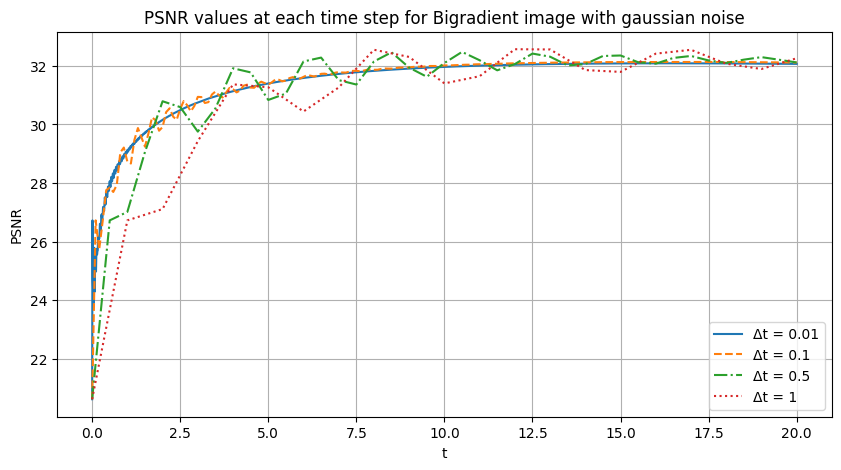

In [ ]:
title = 'PSNR values at each time step for Bigradient image with gaussian noise'
plot_psnr(psnr_bigrad_gauss, dt_set, title)

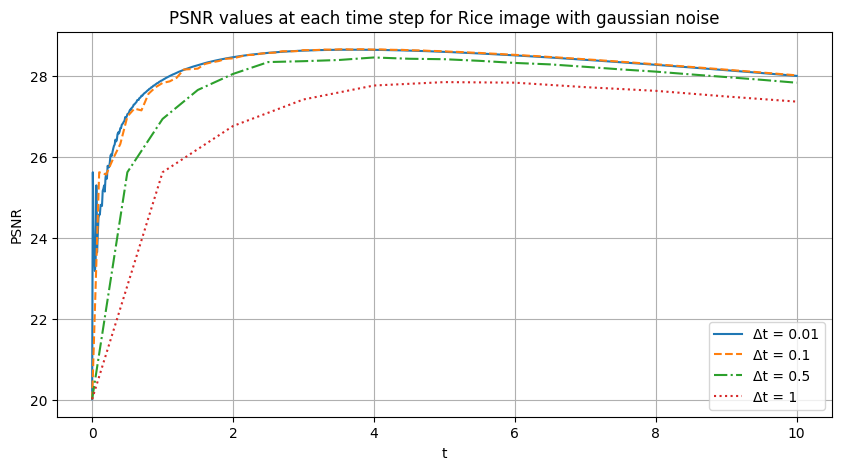

In [ ]:
title = 'PSNR values at each time step for Rice image with gaussian noise'
plot_psnr(psnr_rice_gauss, dt_set, title)

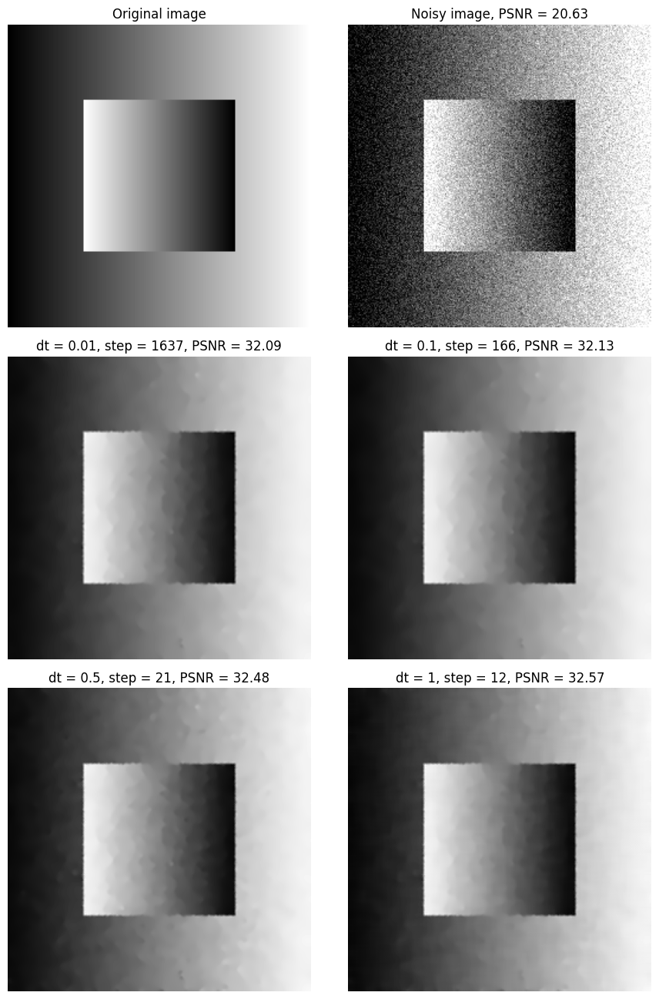

In [ ]:
plot_images(bigrad_image, bigrad_gauss, bigrad_gauss_filtered, psnr_bigrad_gauss, dt_set, (9, 26))

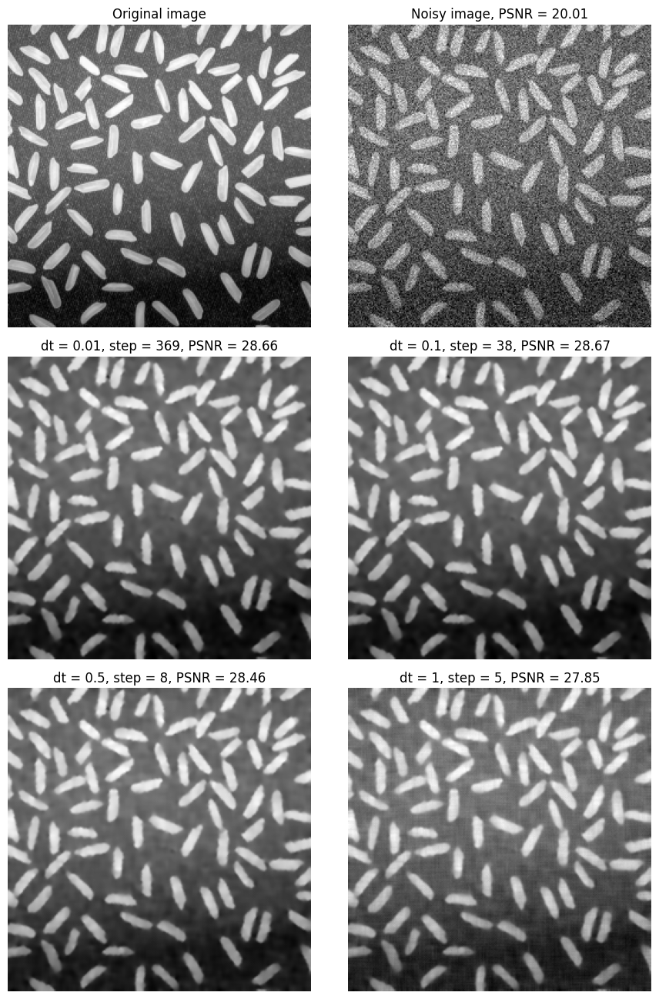

In [ ]:
plot_images(rice_image, rice_gauss, rice_gauss_filtered, psnr_rice_gauss, dt_set, (9, 26))

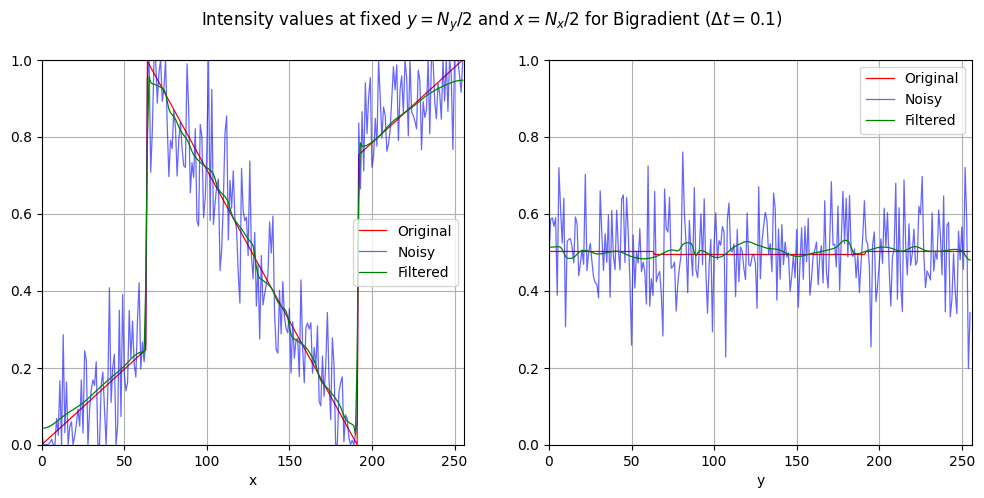

In [ ]:
title = f'Intensity values at fixed $y=N_y/2$ and $x=N_x/2$ for Bigradient ($\Delta t = {dt_set[1]}$)'
plot_intensity_along_axes(bigrad_image, bigrad_gauss, bigrad_gauss_filtered[1], 128, 128, title)

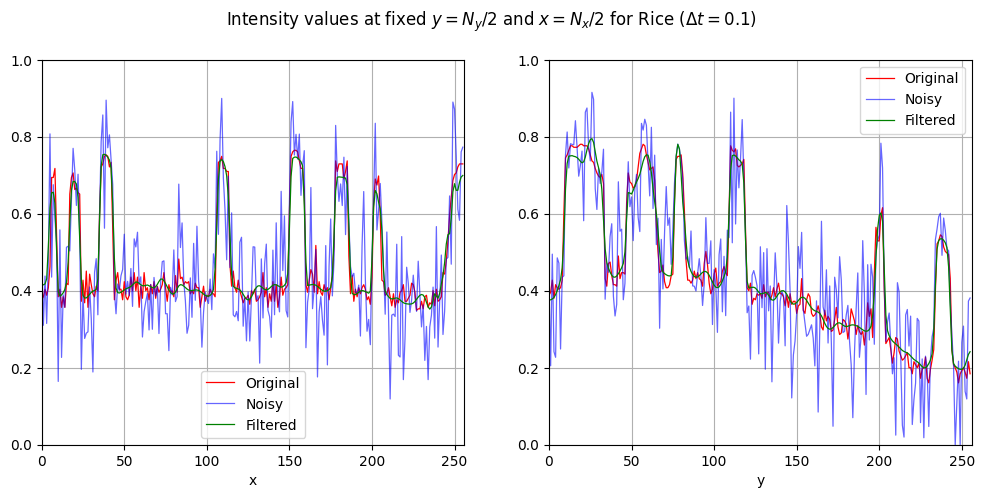

In [ ]:
title = f'Intensity values at fixed $y=N_y/2$ and $x=N_x/2$ for Rice ($\Delta t = {dt_set[1]}$)'
plot_intensity_along_axes(rice_image, rice_gauss, rice_gauss_filtered[1], 128, 128, title)

In [ ]:
plt.imsave('bigrad_gauss.png', bigrad_gauss, cmap='gray')
plt.imsave('bigrad_gauss_filtered_001.png', np.squeeze(bigrad_gauss_filtered[0]), cmap='gray')
plt.imsave('bigrad_gauss_filtered_1.png', np.squeeze(bigrad_gauss_filtered[3]), cmap='gray')

In [ ]:
plt.imsave('rice_gauss.png', rice_gauss, cmap='gray')
plt.imsave('rice_gauss_filtered_001.png', np.squeeze(rice_gauss_filtered[0]), cmap='gray')
plt.imsave('rice_gauss_filtered_1.png', np.squeeze(rice_gauss_filtered[3]), cmap='gray')

## Synthetic images: salt and pepper noise

In [ ]:
bigrad_sp = add_sp_noise(bigrad_image)
rice_sp = add_sp_noise(rice_image)

t_end = 10
dt_set = [0.01, 0.1, 0.5, 1]

psnr_bigrad_sp, bigrad_sp_filtered = run_LBM(bigrad_sp, bigrad_image, t_end*6, dt_set)
psnr_rice_sp, rice_sp_filtered = run_LBM(rice_sp, rice_image, t_end, dt_set)

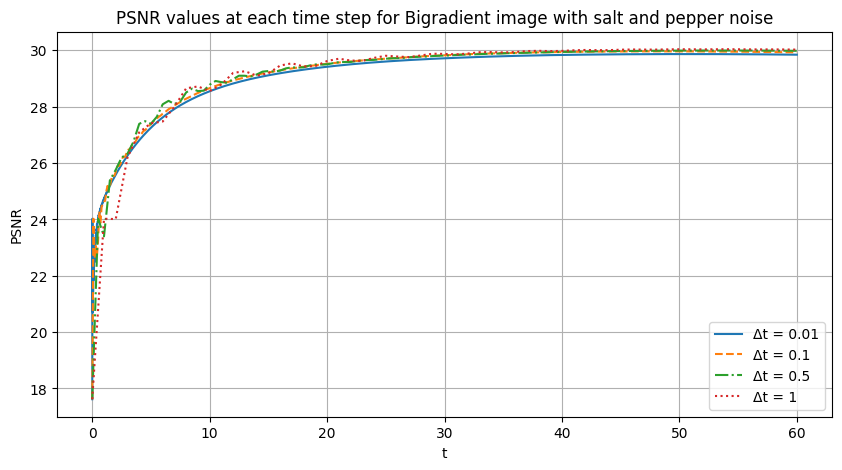

In [ ]:
title = 'PSNR values at each time step for Bigradient image with salt and pepper noise'
plot_psnr(psnr_bigrad_sp, dt_set, title)

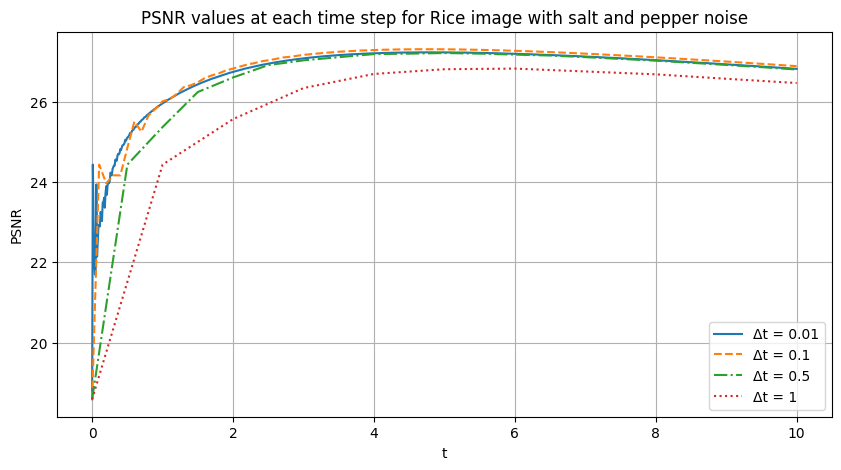

In [ ]:
title = 'PSNR values at each time step for Rice image with salt and pepper noise'
plot_psnr(psnr_rice_sp, dt_set, title)

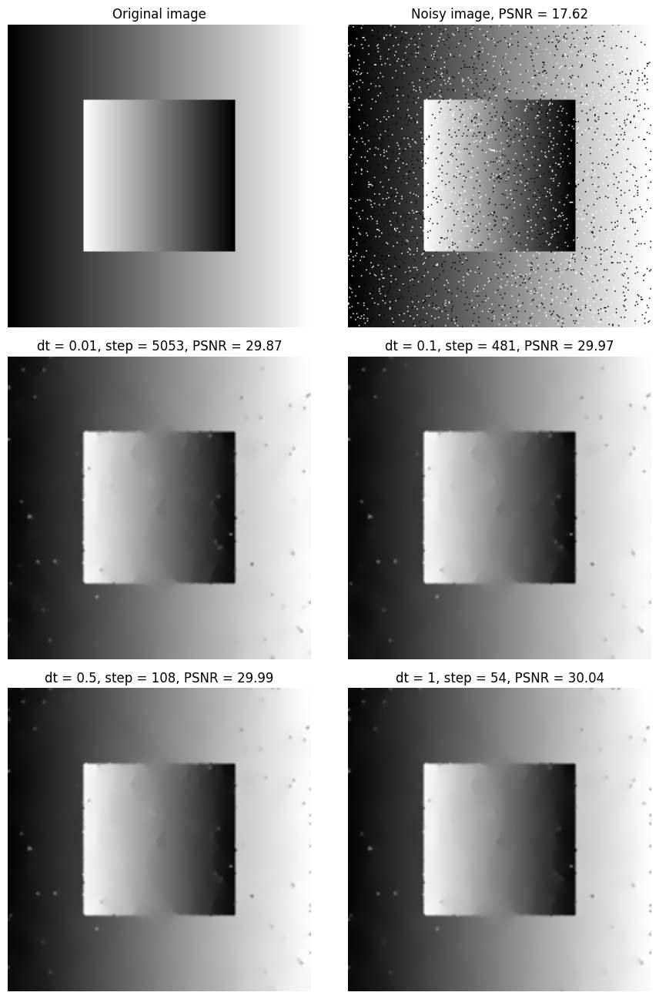

In [ ]:
plot_images(bigrad_image, bigrad_sp, bigrad_sp_filtered, psnr_bigrad_sp, dt_set, (9, 26))

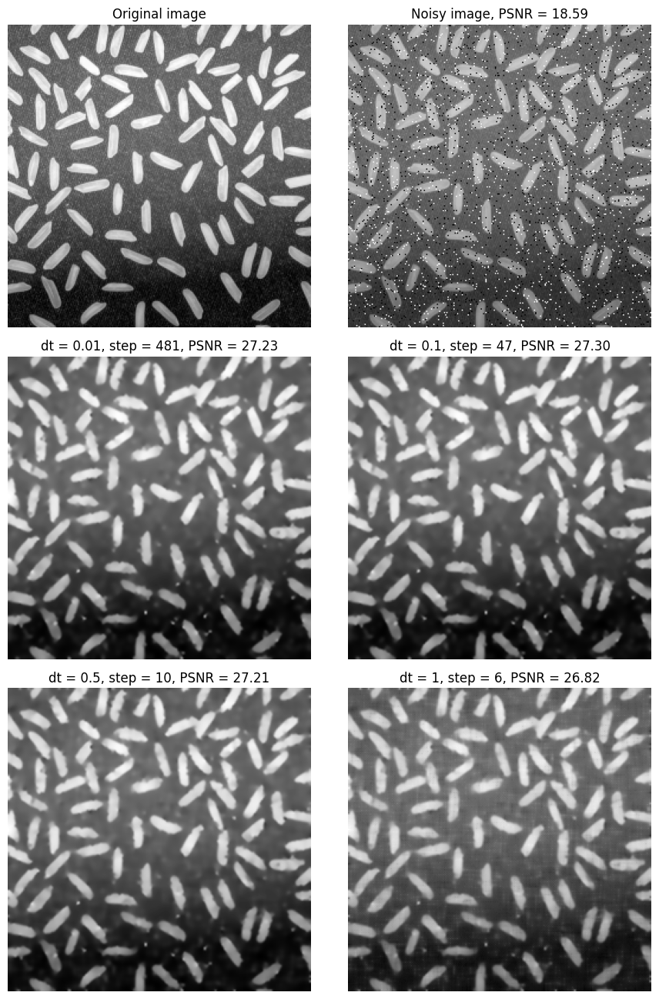

In [ ]:
plot_images(rice_image, rice_sp, rice_sp_filtered, psnr_rice_sp, dt_set, (9, 26))

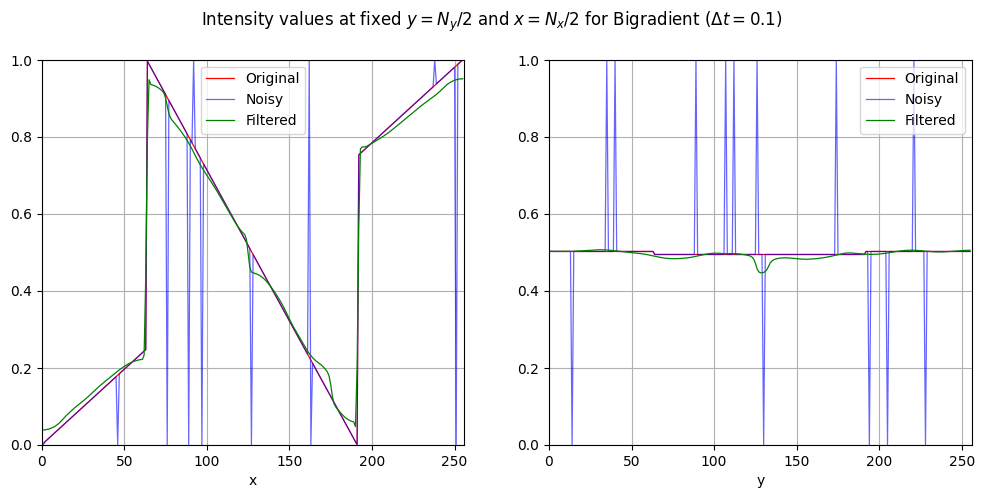

In [ ]:
title = f'Intensity values at fixed $y=N_y/2$ and $x=N_x/2$ for Bigradient ($\Delta t = {dt_set[1]}$)'
plot_intensity_along_axes(bigrad_image, bigrad_sp, bigrad_sp_filtered[1], 128, 128, title)

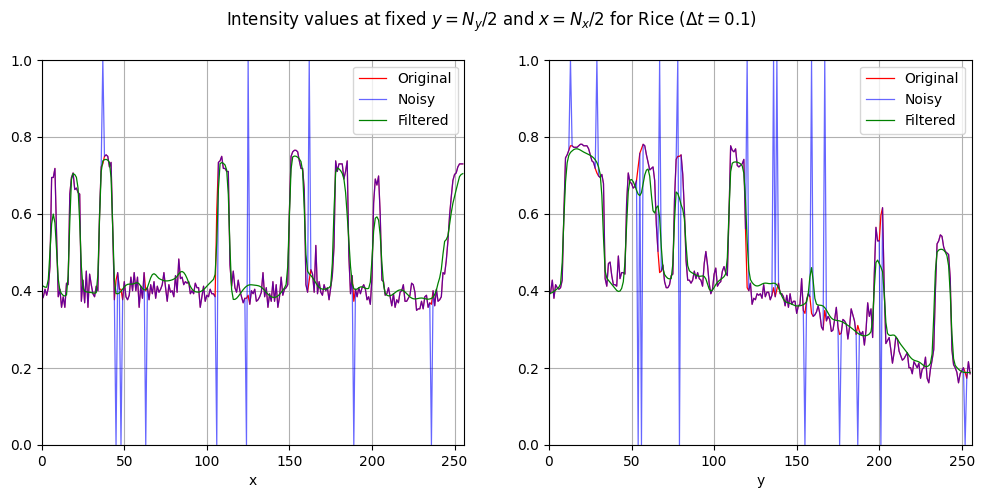

In [ ]:
title = f'Intensity values at fixed $y=N_y/2$ and $x=N_x/2$ for Rice ($\Delta t = {dt_set[1]}$)'
plot_intensity_along_axes(rice_image, rice_sp, rice_sp_filtered[1], 128, 128, title)

In [ ]:
plt.imsave('bigrad_sp.png', bigrad_sp, cmap='gray')
plt.imsave('bigrad_sp_filtered_001.png', np.squeeze(bigrad_sp_filtered[0]), cmap='gray')
plt.imsave('bigrad_sp_filtered_1.png', np.squeeze(bigrad_sp_filtered[3]), cmap='gray')

In [ ]:
plt.imsave('rice_sp.png', rice_sp, cmap='gray')
plt.imsave('rice_sp_filtered_001.png', np.squeeze(rice_sp_filtered[0]), cmap='gray')
plt.imsave('rice_sp_filtered_1.png', np.squeeze(rice_sp_filtered[3]), cmap='gray')

## Everest: gaussian noise

In [ ]:
everest_gauss = add_gauss_noise(everest_image)

t_end = 10
dt_set = [0.01, 0.1, 0.5, 1]

psnr_everest_gauss, everest_gauss_filtered = run_LBM(everest_gauss, everest_image, t_end, dt_set)

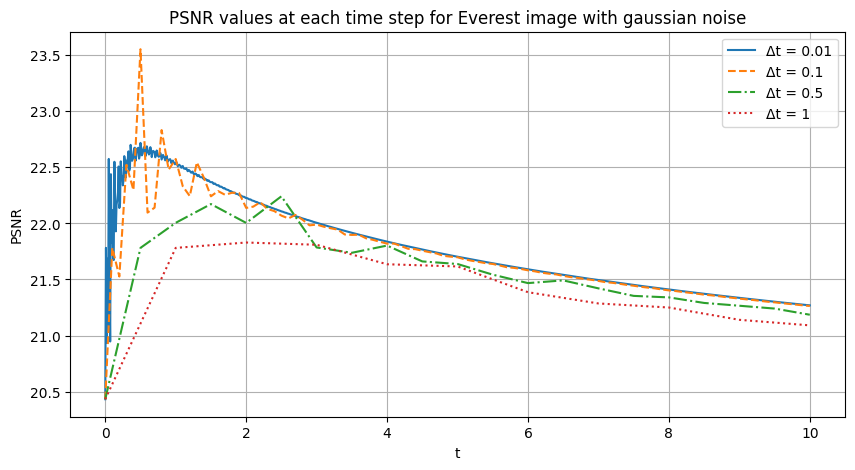

In [ ]:
title = 'PSNR values at each time step for Everest image with gaussian noise'
plot_psnr(psnr_everest_gauss, dt_set, title)

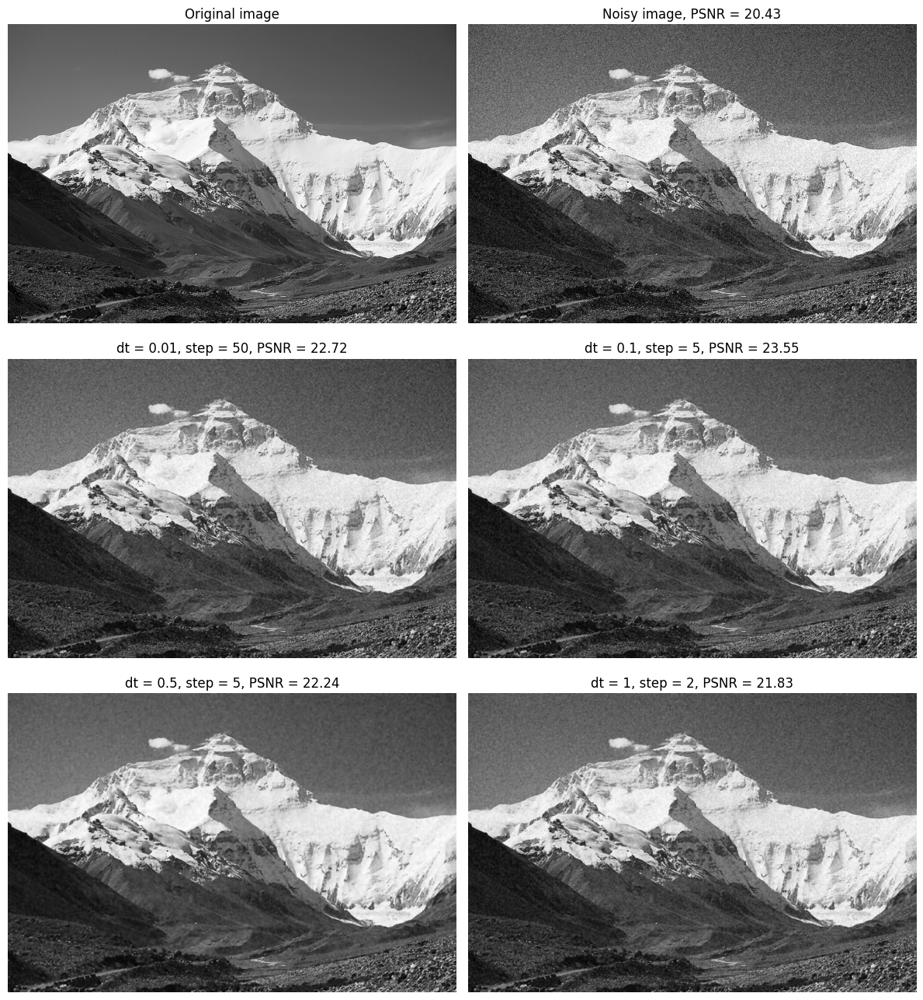

In [ ]:
plot_images(everest_image, everest_gauss, everest_gauss_filtered, psnr_everest_gauss, dt_set, (12, 26))

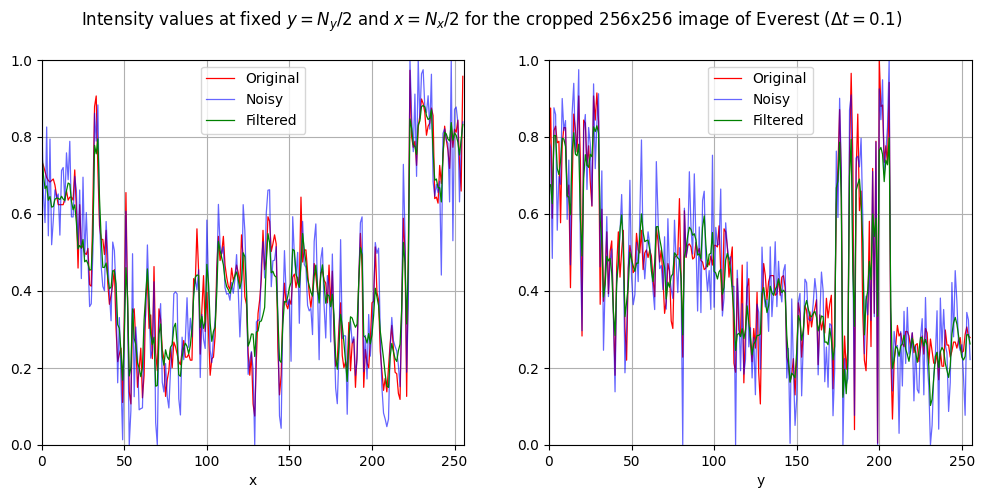

In [ ]:
Ny, Nx = everest_image.shape
x, y = Nx//2, Ny//2

# We will take a 256x256 image fragment
image_frag = everest_image[y-128:y+128, x-128:x+128]
noisy_frag = everest_gauss[y-128:y+128, x-128:x+128]
filtered_frag = everest_gauss_filtered[1][y-128:y+128, x-128:x+128]

title = f'Intensity values at fixed $y=N_y/2$ and $x=N_x/2$ for the cropped 256x256 image of Everest ($\Delta t = {dt_set[1]}$)'
plot_intensity_along_axes(image_frag, noisy_frag, filtered_frag, 128, 128, title)

## Everest: salt and pepper noise

In [ ]:
everest_sp = add_sp_noise(everest_image)

t_end = 10
dt_set = [0.01, 0.1, 0.5, 1]

psnr_everest_sp, everest_sp_filtered = run_LBM(everest_sp, everest_image, t_end, dt_set)

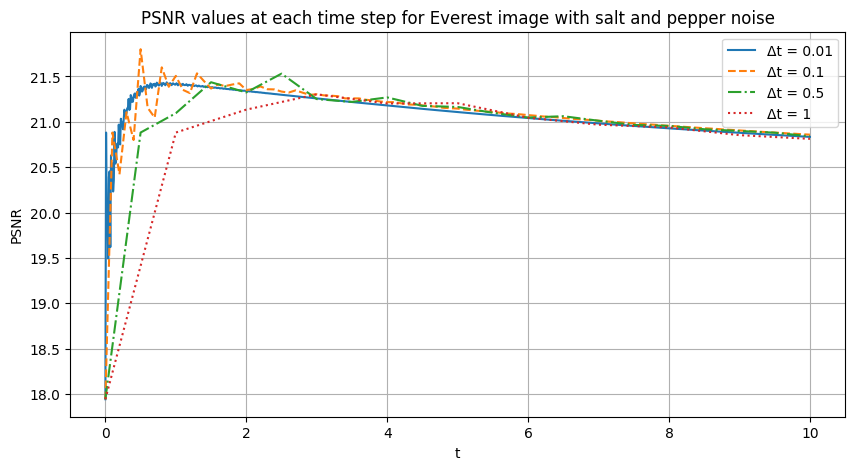

In [ ]:
title = 'PSNR values at each time step for Everest image with salt and pepper noise'
plot_psnr(psnr_everest_sp, dt_set, title)

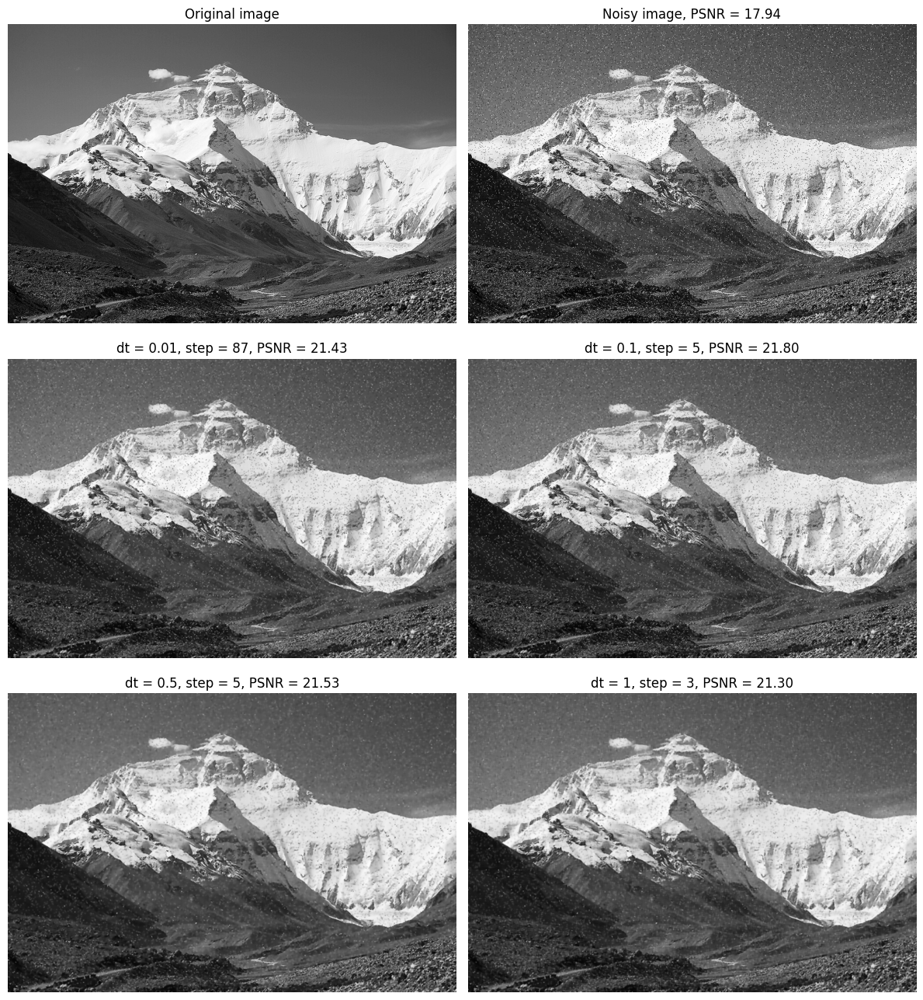

In [ ]:
plot_images(everest_image, everest_sp, everest_sp_filtered, psnr_everest_sp, dt_set, (12, 26))

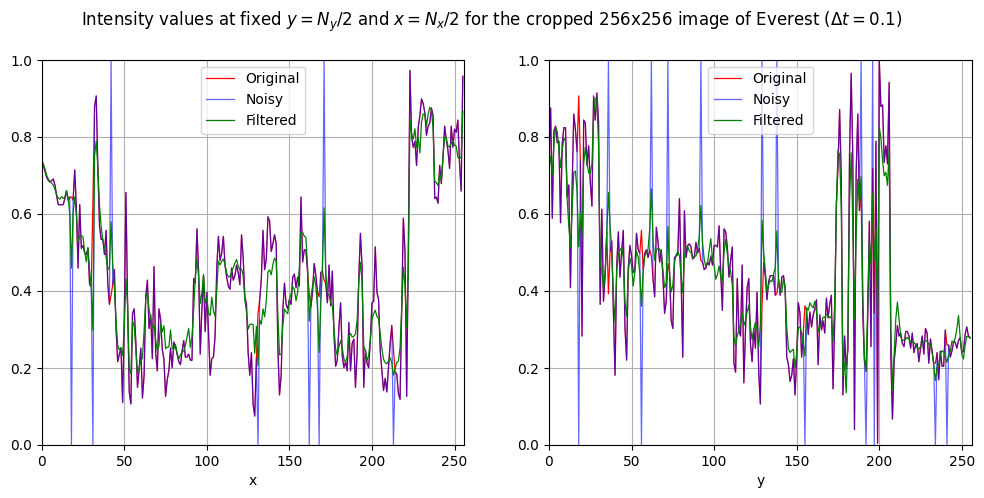

In [ ]:
Ny, Nx = everest_image.shape
x, y = Nx//2, Ny//2

# We will take a 256x256 image fragment
image_frag = everest_image[y-128:y+128, x-128:x+128]
noisy_frag = everest_sp[y-128:y+128, x-128:x+128]
filtered_frag = everest_sp_filtered[1][y-128:y+128, x-128:x+128]

title = f'Intensity values at fixed $y=N_y/2$ and $x=N_x/2$ for the cropped 256x256 image of Everest ($\Delta t = {dt_set[1]}$)'
plot_intensity_along_axes(image_frag, noisy_frag, filtered_frag, 128, 128, title)

# Decorrelation Criterion for Stopping Time


In this section, we consider the decorrelation criterion, first proposed in the work of [Mrazek, 2003](https://doi.org/10.1023/A:1022908225256). Based on the assumption that the true noise $n$ does not correlate with the true signal $f$, our goal is to obtain a filtered signal $u(T)$ that minimally correlates with the noise. The noise estimate in this case can be represented as the difference between the original image and the image at the current step: $u(0) - u(T)$. The correlation coefficient between the noise and the original signal is defined as:

$$
\operatorname{corr}(u(0)-u(t), u(t)) = \frac
{\text{cov}(u(0)-u(t), u(0))}
{\sqrt{\text{var}(u(0)-u(t))\cdot \text{var}(u(t))}},
$$

where covariance and variance for two-dimensional images are defined as for vectors of size $N=N_x\times N_y$:

$$
\begin{aligned}
\text{cov}(u, v) &= \mathbb{E}[(u- \overline u)\cdot(v- \overline v)], \\
\text{var}(u) &= \mathbb{E}[(u- \overline u)^2], \\
\overline u &= \mathbb{E}(u) = \frac{1}{N}\sum_{i = 1}^{N} u_i.
\end{aligned}
$$

Then the minimum correlation coefficient should indicate the stopping time:

$$
T_{\text{decor}} = \operatorname*{argmin}_t \left| \operatorname{corr}(u(0)-u(t), u(t)) \right|.
$$

This resulting criterion is called the decorrelation criterion. It is developed for the task of image filtering using nonlinear diffusion methods and can be applied in a wide range of conditions, as it does not require any additional knowledge about the nature of the noise and signal.

In [20]:
def corr(x, y):
    d_x = x - np.mean(x)
    d_y = y - np.mean(y)
    cov = np.mean(d_x*d_y)
    var_x = np.mean(d_x**2)
    var_y = np.mean(d_y**2)
    return cov/np.sqrt(var_x*var_y)

Function for LBM D2Q5 with decorrelation criterion:

In [21]:
def LBM_with_stopping_time(noisy_image, original_image, dt, num_steps):
    # D2Q5
    alpha_i = np.array([[1/5, 1/5, 1/5, 1/5, 1/5]])
    beta = 2
    gamma = 2.5

    # Initilization
    u = np.expand_dims(noisy_image, 2)
    u_eq_i = u*alpha_i
    u_i = np.copy(u_eq_i)

    psnr_values = [psnr(noisy_image, original_image)]
    corr_values = [0]

    for step in range(num_steps):

        # Compute current gradient and tau
        grad_u = compute_gradient(u, beta)
        tau = compute_tau(grad_u, gamma, dt)

        # Collision
        post_col = u_i - (u_i - u_eq_i)/tau

        # Stream
        # indices denote [y_coordinate, x_coordinate, ith_component]
        u_i[:,:,0] = post_col[:,:,0]
        u_i[:,1:,1] = post_col[:,:-1,1]
        u_i[:-1,:,2] = post_col[1:,:,2]
        u_i[:,:-1,3] = post_col[:,1:,3]
        u_i[1:,:,4] = post_col[:-1,:,4]

        # Boundary treatment for inward-facing distributions
        u_i[:,0,1] = post_col[:,0,1]
        u_i[-1,:,2] = post_col[-1,:,2]
        u_i[:,-1,3] = post_col[:,-1,3]
        u_i[0,:,4] = post_col[0,:,4]

        # New u and u_eq_i
        u = np.sum(u_i, axis=2, keepdims=True)
        u_eq_i = u*alpha_i

        # PSNR values
        psnr_values.append(psnr(np.clip(u[:,:,0], 0, 1), original_image))

        # Correlation of noise and input data
        corr_values.append(np.abs(corr(noisy_image - u[:,:,0], u[:,:,0])))

    return psnr_values, corr_values

## Experiments

In [ ]:
url_lenna = "https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_(test_image).png"
url_bigrad = 'https://pixinsight.com/forum/index.php?attachments/bigradient-png.1873/'
url_rice = 'https://raw.githubusercontent.com/camieac/image-processing-matlab/master/lab06/images/rice.png'

lenna_image = import_image(url_lenna, 256)
bigrad_image = import_image(url_bigrad)     # 256 x 256
rice_image = import_image(url_rice)         # 256 x 256

lenna_gauss = add_gauss_noise(lenna_image)
lenna_sp = add_sp_noise(lenna_image)
bigrad_gauss = add_gauss_noise(bigrad_image)
bigrad_sp = add_sp_noise(bigrad_image)
rice_gauss = add_gauss_noise(rice_image)
rice_sp = add_sp_noise(rice_image)

To evaluate the feasibility of using the decorrelation criterion, we will conduct a numerical study. First, let's examine the behavior of the quantity ${\operatorname{corr}(u(0)-u(t), u(t))}$ during the filtration process using the LBM D2Q5 algorithm ($\Delta t = 0.03$) using the example of an image Lena with Gaussian noise $\sigma = 0.1$:

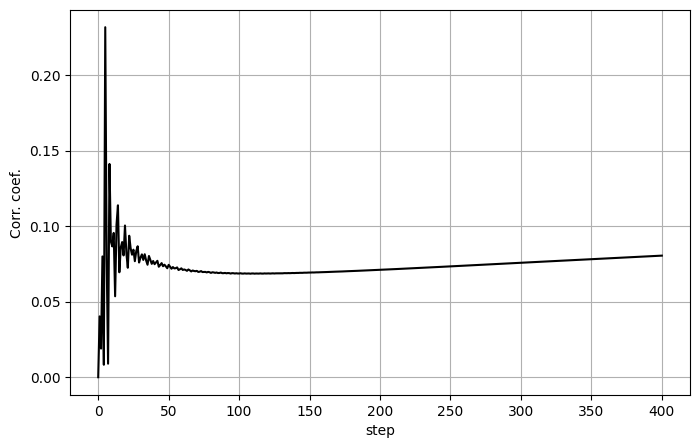

In [ ]:
psnr_values, corr_values = LBM_with_stopping_time(lenna_gauss, lenna_image, 0.03, 400)
plot_corr_coef(corr_values)

As can be seen from the above graph, it takes time for the correlation coefficient to reach a stable mode, since at the initial stage the estimations used for the noise $u(0)-u(t) \simeq 0$ and the original image $u(t)$ are not accurate. Only after a certain number of filtration steps, the quantity $\operatorname{corr}(u(0)-u(t), u(t))$ reflects the expected behavior with a discernible minimum.

For small Gaussian noise $\sigma \simeq 0.05$, this local minimum disappears, and the function $\operatorname{corr}(u(0)-u(t), u(t))$ generally only increases. A similar behavior is observed for low-intensity "salt and pepper" noise with $p \simeq 0.01$ (fraction of corrupted pixels). This can be compensated by reducing the step size $\Delta t$ and restarting the filtering process until a discernible minimum appears.


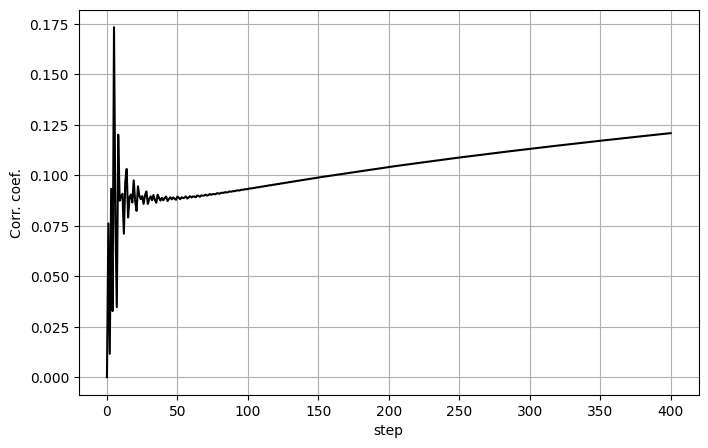

In [ ]:
psnr_values, corr_values = LBM_with_stopping_time(add_gauss_noise(lenna_image, sigma=0.05), lenna_image, 0.03, 400)
plot_corr_coef(corr_values)


Another obvious problem is that in practice it will not be possible to automatically use the decorrelation criterion in the previously proposed form:

\begin{equation}
T_{\text{decor}} = \operatorname*{argmin}_t \left| \operatorname{corr}(u(0)-u(t), u(t)) \right|.
\end{equation}

However, it is possible to switch from searching for a global minimum to a local one: introduce a function that checks, for each index $n$ in the array of values $\operatorname{corr}(u(0)-u(t), u(t))$, whether the element at position $n$ is smaller than all elements with indices ${[n-w,\ldots,n+w]}$, where $w$ is the width of the sliding window. Experiments show that a reasonable choice for the window is $w=20$.

Now, considering the aforementioned circumstances, let's assess the applicability of the decorrelation criterion. We will take a test set of three grayscale images with a size of $256\times256$ and pixel intensity range $[0,1]$. We will separately consider two types of noise:
- Gaussian noise with standard deviation $\sigma \in [0.05, 0.15]$ and zero mean,
- "Salt and pepper" noise with intensity $p \in [0.02,0.1]$.

After applying the noise $n$, each image $u(0)=\hat u + n$ is processed using the LBM D2Q5 method described earlier. For simplicity, we will use a fixed small step size $\Delta t = 0.01$. Within the specified noise ranges, this step size provides a discernible local minimum for the function $\operatorname{corr}(u(0)-u(t), u(t))$.

Since we know the original image $\hat u$ for the test images, the optimal stopping time is determined as:

\begin{equation}
    T_{\text{opt}} = \operatorname*{argmax}_t\{ \text{PSNR}(u(t), \hat u)\}.
\end{equation}

For the decorrelation criterion to be applicable, the value $T_{\text{corr}}$ should be close to $T_{\text{opt}}$. Additionally, the deviation $\text{PSNR}(u(T_{\text{corr}}), \hat u)$ from $\text{PSNR}(u(T_{\text{opt}}), \hat u)$ should be minimal.

## Decorrelation criterion for Gaussian noise

In [ ]:
from scipy.signal import argrelextrema

sigma_list = [0.05, 0.075, 0.1, 0.125, 0.15, 0.175, 0.2, 0.225, 0.25]

def compute_optimal_t(image, sigma_list, num_steps, dt):
    optimal_t = []
    decorr_t = []
    psnr_optimal = []
    psnr_decorr = []

    for sigma in sigma_list:
        noisy_image = add_gauss_noise(image, mean=0, sigma=sigma)
        psnr_values, corr_values = LBM_with_stopping_time(noisy_image, image, dt, num_steps)

        optimal_t.append(np.argmax(psnr_values))
        psnr_optimal.append(np.max(psnr_values))

        t = argrelextrema(np.array(corr_values), np.less_equal, order=20)[0][-1]
        print("Local minima:", argrelextrema(np.array(corr_values), np.less_equal, order=20)[0],
              ", PSNR_corr:", round(psnr_values[t], 2),
              "  ||  Optimal T:", np.argmax(psnr_values),
              ", PSNR_opt:", round(np.max(psnr_values),2),
              )
        decorr_t.append(t)
        psnr_decorr.append(psnr_values[t])

    return optimal_t, decorr_t, psnr_optimal, psnr_decorr

### Lenna image with Gaussian noise

In [ ]:
optimal_t, decorr_t, psnr_optimal, psnr_decorr = compute_optimal_t(lenna_image, sigma_list, 1500, 0.01)

Local minima: [  0 117] , PSNR_corr: 31.53   ||  Optimal T: 70 , PSNR_opt: 31.67
Local minima: [  0 222] , PSNR_corr: 30.04   ||  Optimal T: 145 , PSNR_opt: 30.16
Local minima: [  0 324] , PSNR_corr: 29.01   ||  Optimal T: 237 , PSNR_opt: 29.07
Local minima: [  0 474] , PSNR_corr: 28.02   ||  Optimal T: 352 , PSNR_opt: 28.08
Local minima: [  0 648] , PSNR_corr: 27.16   ||  Optimal T: 487 , PSNR_opt: 27.21
Local minima: [  0 791] , PSNR_corr: 26.45   ||  Optimal T: 609 , PSNR_opt: 26.5
Local minima: [   0 1014] , PSNR_corr: 26.02   ||  Optimal T: 740 , PSNR_opt: 26.08
Local minima: [   0 1194] , PSNR_corr: 25.31   ||  Optimal T: 852 , PSNR_opt: 25.38
Local minima: [   0 1500] , PSNR_corr: 24.68   ||  Optimal T: 999 , PSNR_opt: 24.79


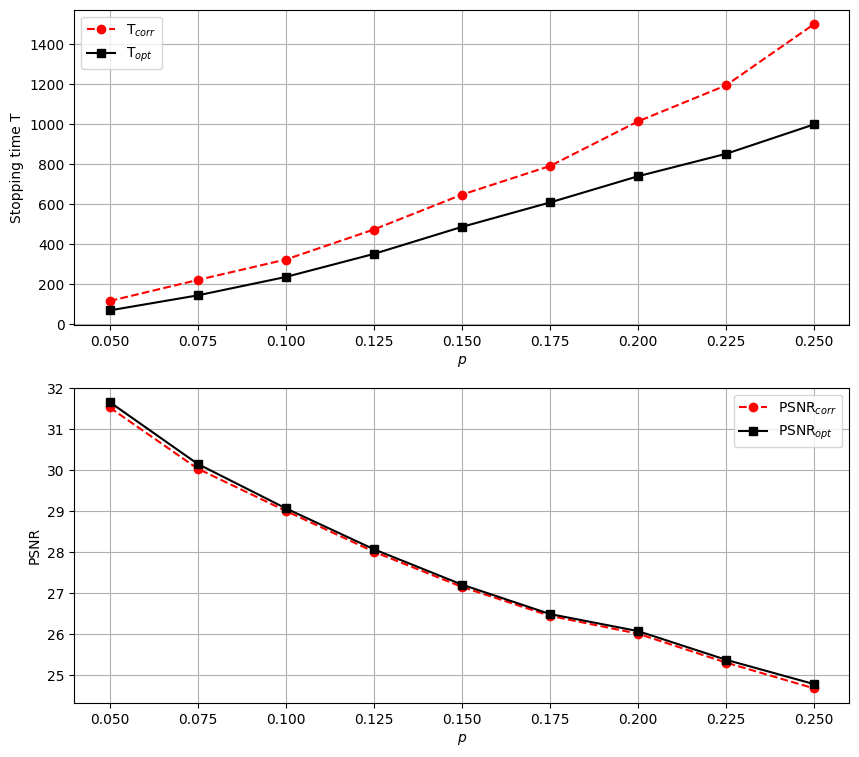

In [ ]:
plot_for_decorr(sigma_list, decorr_t, optimal_t, psnr_decorr, psnr_optimal)

### Bigradient image with Gaussian noise

In [ ]:
optimal_t, decorr_t, psnr_optimal, psnr_decorr = compute_optimal_t(bigrad_image, sigma_list, 5000, 0.01)

Local minima: [  0 397] , PSNR_corr: 34.3   ||  Optimal T: 779 , PSNR_opt: 34.45
Local minima: [  0 658] , PSNR_corr: 33.2   ||  Optimal T: 1244 , PSNR_opt: 33.38
Local minima: [  0 924] , PSNR_corr: 31.98   ||  Optimal T: 1652 , PSNR_opt: 32.15
Local minima: [   0 1244] , PSNR_corr: 30.83   ||  Optimal T: 2111 , PSNR_opt: 30.98
Local minima: [   0 1589] , PSNR_corr: 29.46   ||  Optimal T: 2424 , PSNR_opt: 29.54
Local minima: [   0 1887] , PSNR_corr: 28.29   ||  Optimal T: 2802 , PSNR_opt: 28.36
Local minima: [   0 2385] , PSNR_corr: 27.11   ||  Optimal T: 3141 , PSNR_opt: 27.14
Local minima: [   0 2653] , PSNR_corr: 26.05   ||  Optimal T: 3340 , PSNR_opt: 26.06
Local minima: [   0 3214] , PSNR_corr: 24.92   ||  Optimal T: 3762 , PSNR_opt: 24.93


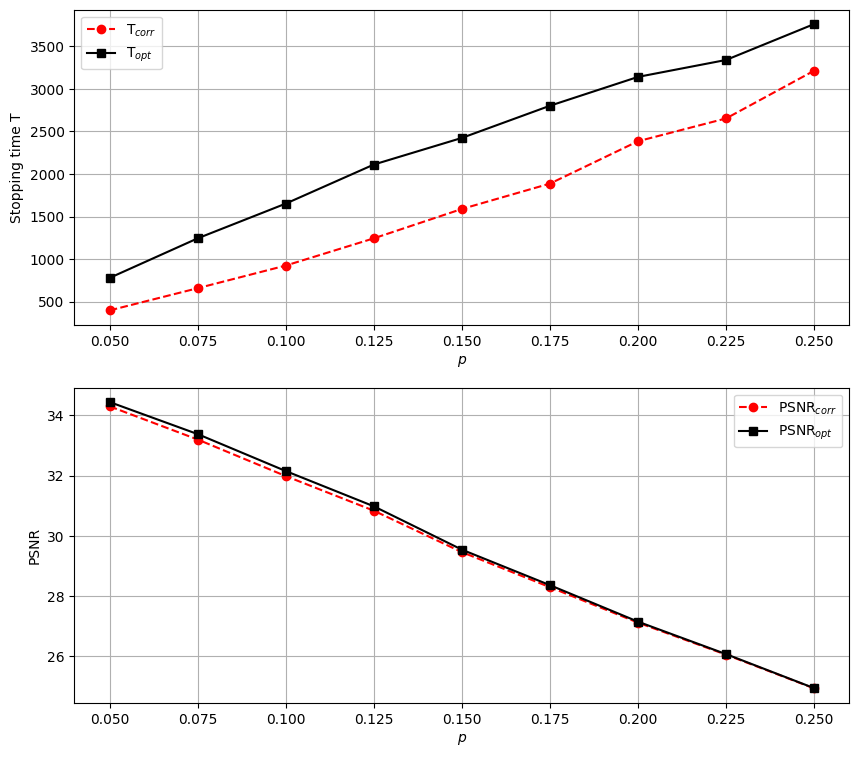

In [ ]:
plot_for_decorr(sigma_list, decorr_t, optimal_t, psnr_decorr, psnr_optimal)

### Rice image with Gaussian noise

In [ ]:
optimal_t, decorr_t, psnr_optimal, psnr_decorr = compute_optimal_t(rice_image, sigma_list, 900, 0.01)

Local minima: [  0 337] , PSNR_corr: 27.17   ||  Optimal T: 492 , PSNR_opt: 27.26
Local minima: [  0 397] , PSNR_corr: 26.09   ||  Optimal T: 565 , PSNR_opt: 26.18
Local minima: [  0 456] , PSNR_corr: 25.46   ||  Optimal T: 594 , PSNR_opt: 25.51
Local minima: [  0 556] , PSNR_corr: 24.77   ||  Optimal T: 644 , PSNR_opt: 24.78
Local minima: [  0 641] , PSNR_corr: 24.27   ||  Optimal T: 671 , PSNR_opt: 24.27
Local minima: [  0 695] , PSNR_corr: 23.62   ||  Optimal T: 703 , PSNR_opt: 23.62
Local minima: [  0 765] , PSNR_corr: 23.26   ||  Optimal T: 718 , PSNR_opt: 23.27
Local minima: [  0 883] , PSNR_corr: 22.7   ||  Optimal T: 733 , PSNR_opt: 22.72
Local minima: [  0 900] , PSNR_corr: 22.26   ||  Optimal T: 743 , PSNR_opt: 22.28


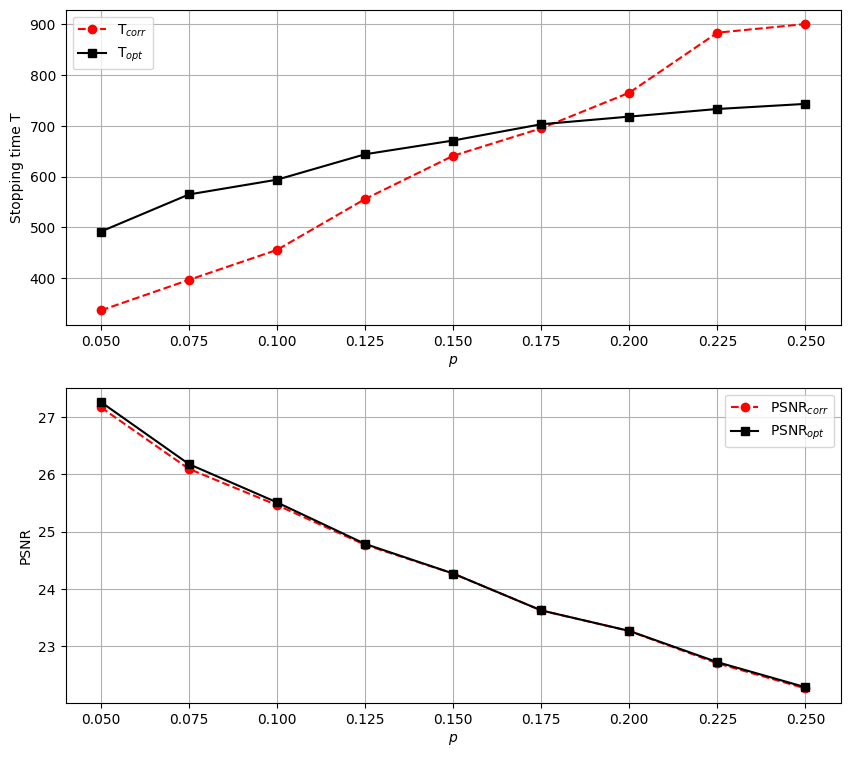

In [ ]:
plot_for_decorr(sigma_list, decorr_t, optimal_t, psnr_decorr, psnr_optimal)

## Decorrelation criterion for Salt and pepper noise

In [ ]:
from scipy.signal import argrelextrema

p_list = [0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]

def compute_optimal_t(image, p_list, num_steps, dt):
    optimal_t = []
    decorr_t = []
    psnr_optimal = []
    psnr_decorr = []

    for p in p_list:
        noisy_image = add_sp_noise(image, amount=p)
        psnr_values, corr_values = LBM_with_stopping_time(noisy_image, image, dt, num_steps)

        optimal_t.append(np.argmax(psnr_values))
        psnr_optimal.append(np.max(psnr_values))

        t = argrelextrema(np.array(corr_values), np.less_equal, order=20)[0][-1]
        print("Local minima:", argrelextrema(np.array(corr_values), np.less_equal, order=20)[0],
              ", PSNR_corr:", round(psnr_values[t], 2),
              "  ||  Optimal T:", np.argmax(psnr_values),
              ", PSNR_opt:", round(np.max(psnr_values),2),
              )
        decorr_t.append(t)
        psnr_decorr.append(psnr_values[t])

    return optimal_t, decorr_t, psnr_optimal, psnr_decorr

### Lenna image with Salt and pepper noise

In [ ]:
optimal_t, decorr_t, psnr_optimal, psnr_decorr = compute_optimal_t(lenna_image, p_list, 1500, 0.01)

Local minima: [  0 540] , PSNR_corr: 28.54   ||  Optimal T: 259 , PSNR_opt: 28.88
Local minima: [  0 576] , PSNR_corr: 27.97   ||  Optimal T: 329 , PSNR_opt: 28.18
Local minima: [  0 587] , PSNR_corr: 27.56   ||  Optimal T: 395 , PSNR_opt: 27.68
Local minima: [  0 698] , PSNR_corr: 27.07   ||  Optimal T: 427 , PSNR_opt: 27.22
Local minima: [  0 726] , PSNR_corr: 26.68   ||  Optimal T: 487 , PSNR_opt: 26.77
Local minima: [  0 824] , PSNR_corr: 26.33   ||  Optimal T: 539 , PSNR_opt: 26.43
Local minima: [  0 850] , PSNR_corr: 26.12   ||  Optimal T: 575 , PSNR_opt: 26.2
Local minima: [  0 970] , PSNR_corr: 25.74   ||  Optimal T: 662 , PSNR_opt: 25.81
Local minima: [   0 1060] , PSNR_corr: 25.55   ||  Optimal T: 688 , PSNR_opt: 25.65


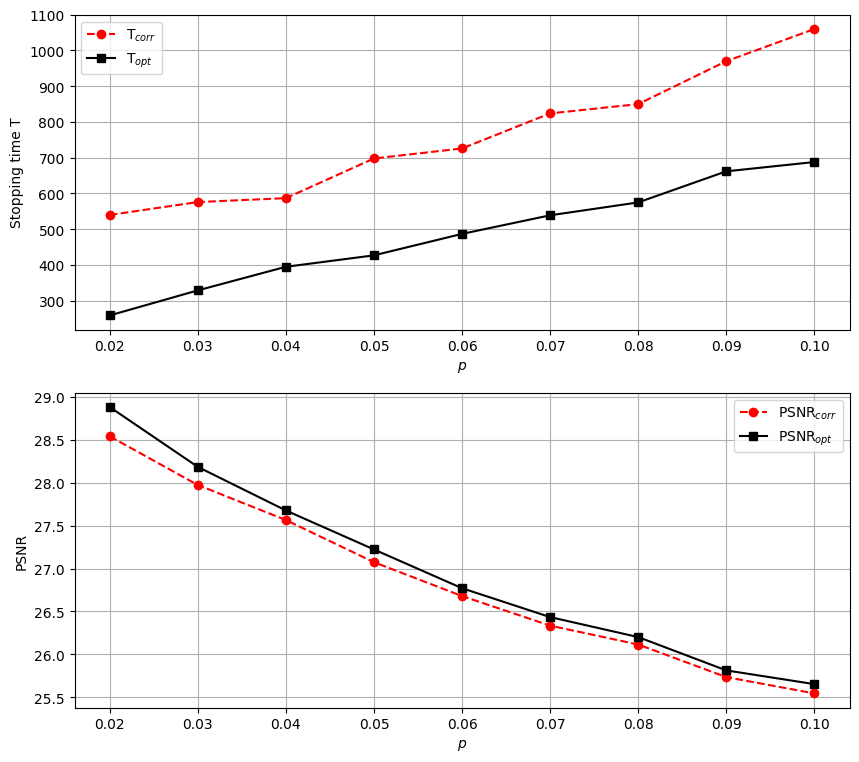

In [ ]:
plot_for_decorr(p_list, decorr_t, optimal_t, psnr_decorr, psnr_optimal)

### Bigradient image with Salt and pepper noise

In [ ]:
optimal_t, decorr_t, psnr_optimal, psnr_decorr = compute_optimal_t(bigrad_image, p_list, 6000, 0.01)

Local minima: [   0 2302] , PSNR_corr: 31.66   ||  Optimal T: 4104 , PSNR_opt: 32.1
Local minima: [   0 2211] , PSNR_corr: 30.98   ||  Optimal T: 4015 , PSNR_opt: 31.25
Local minima: [   0 1914] , PSNR_corr: 30.21   ||  Optimal T: 4582 , PSNR_opt: 30.64
Local minima: [   0 1747] , PSNR_corr: 29.43   ||  Optimal T: 5007 , PSNR_opt: 30.05
Local minima: [   0 1991] , PSNR_corr: 28.64   ||  Optimal T: 5182 , PSNR_opt: 29.17
Local minima: [   0 1885] , PSNR_corr: 28.3   ||  Optimal T: 5639 , PSNR_opt: 28.91
Local minima: [   0 2401] , PSNR_corr: 27.71   ||  Optimal T: 5631 , PSNR_opt: 28.12
Local minima: [   0 2551] , PSNR_corr: 27.31   ||  Optimal T: 5518 , PSNR_opt: 27.62
Local minima: [   0 2596] , PSNR_corr: 27.0   ||  Optimal T: 5145 , PSNR_opt: 27.22


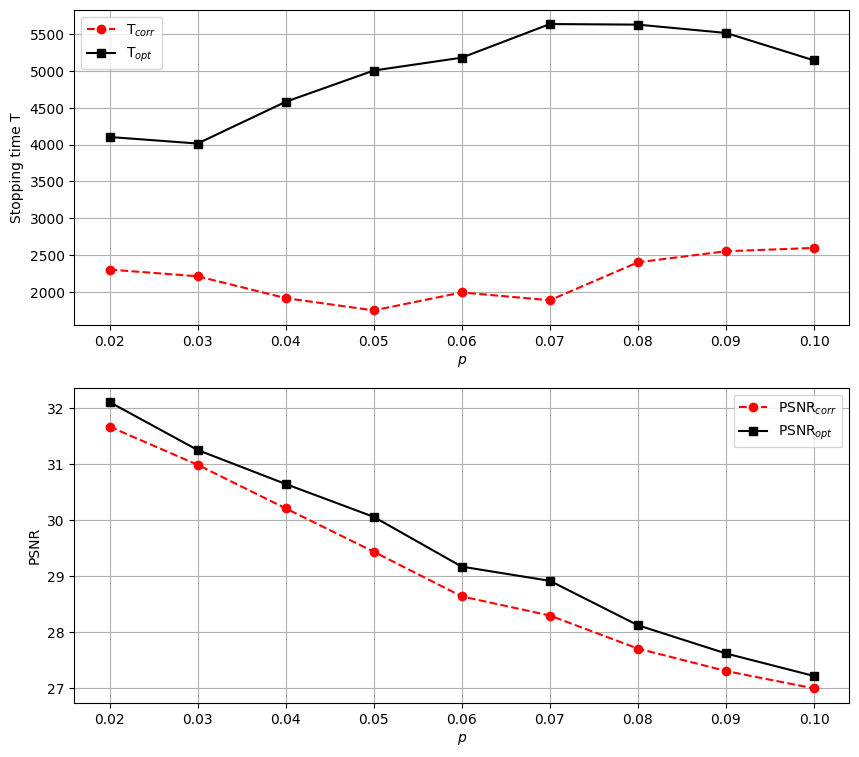

In [ ]:
plot_for_decorr(p_list, decorr_t, optimal_t, psnr_decorr, psnr_optimal)

### Rice image with Salt and pepper noise

In [ ]:
optimal_t, decorr_t, psnr_optimal, psnr_decorr = compute_optimal_t(rice_image, p_list, 1000, 0.01)

Local minima: [  0 241] , PSNR_corr: 28.71   ||  Optimal T: 369 , PSNR_opt: 28.82
Local minima: [  0 300] , PSNR_corr: 28.18   ||  Optimal T: 420 , PSNR_opt: 28.26
Local minima: [  0 323] , PSNR_corr: 27.53   ||  Optimal T: 464 , PSNR_opt: 27.61
Local minima: [  0 337] , PSNR_corr: 27.27   ||  Optimal T: 496 , PSNR_opt: 27.37
Local minima: [  0 368] , PSNR_corr: 26.78   ||  Optimal T: 528 , PSNR_opt: 26.87
Local minima: [  0 368] , PSNR_corr: 26.3   ||  Optimal T: 558 , PSNR_opt: 26.42
Local minima: [  0 396] , PSNR_corr: 25.98   ||  Optimal T: 568 , PSNR_opt: 26.07
Local minima: [  0 462] , PSNR_corr: 25.59   ||  Optimal T: 588 , PSNR_opt: 25.63
Local minima: [  0 473] , PSNR_corr: 25.47   ||  Optimal T: 612 , PSNR_opt: 25.52


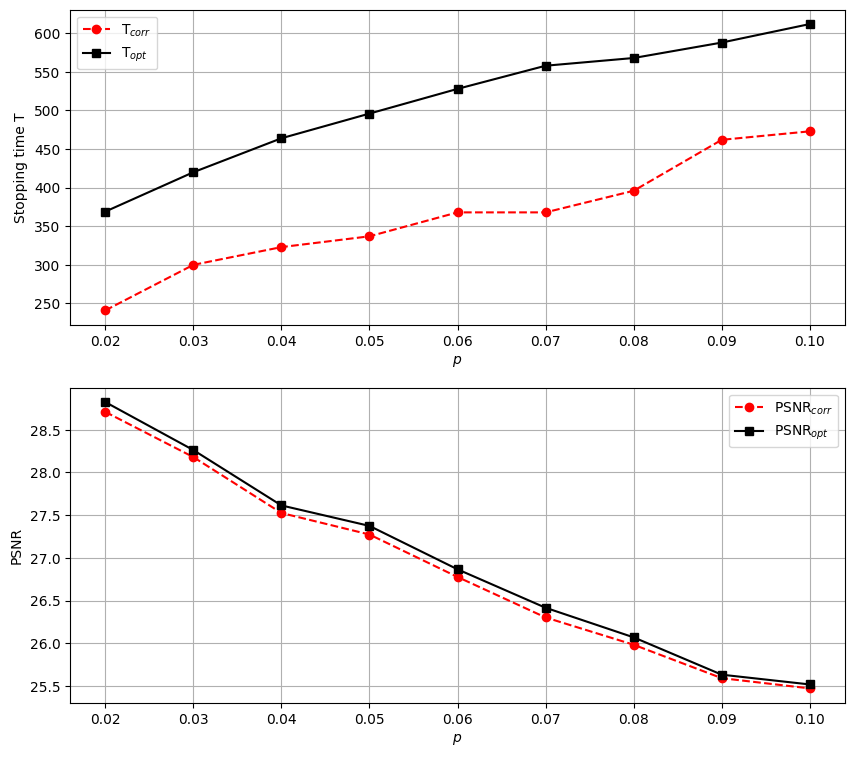

In [ ]:
plot_for_decorr(p_list, decorr_t, optimal_t, psnr_decorr, psnr_optimal)

## Decorrelation of distribution functions

Let's do the same as in the previous section, but we will consider the decorrelation of discrete probability functions $u_{i}$.

In [1]:
def LBM_with_stopping_time_distr_funcs(noisy_image, original_image, dt, num_steps):
    # D2Q5
    alpha_i = np.array([[1/5, 1/5, 1/5, 1/5, 1/5]])
    beta = 2
    gamma = 2.5

    # Initilization
    u = np.expand_dims(noisy_image, 2)
    u_eq_i = u*alpha_i
    u_i = np.copy(u_eq_i)

    psnr_values = [psnr(noisy_image, original_image)]
    psnr_max = 0

    corr_values = []

    for step in range(num_steps):

        # Compute current gradient and tau
        grad_u = compute_gradient(u, beta)
        tau = compute_tau(grad_u, gamma, dt)

        # Collision
        post_col = u_i - (u_i - u_eq_i)/tau

        # Stream
        # indices denote [y_coordinate, x_coordinate, ith_component]
        u_i[:,:,0] = post_col[:,:,0]
        u_i[:,1:,1] = post_col[:,:-1,1]
        u_i[:-1,:,2] = post_col[1:,:,2]
        u_i[:,:-1,3] = post_col[:,1:,3]
        u_i[1:,:,4] = post_col[:-1,:,4]

        # Boundary treatment for inward-facing distributions
        u_i[:,0,1] = post_col[:,0,1]
        u_i[-1,:,2] = post_col[-1,:,2]
        u_i[:,-1,3] = post_col[:,-1,3]
        u_i[0,:,4] = post_col[0,:,4]

        # New u and u_eq_i
        u = np.sum(u_i, axis=2, keepdims=True)
        u_eq_i = u*alpha_i

        # Remember PSNR values
        psnr_t = psnr(np.clip(u[:,:,0], 0, 1), original_image)
        psnr_values.append(psnr_t)

        # Correlation of noise and distribution functions
        corr_values.append([
            np.abs(corr(noisy_image/5 - u_i[:,:,0], u_i[:,:,0])),
            np.abs(corr(noisy_image/5 - u_i[:,:,1], u_i[:,:,1])),
            np.abs(corr(noisy_image/5 - u_i[:,:,2], u_i[:,:,2])),
            np.abs(corr(noisy_image/5 - u_i[:,:,3], u_i[:,:,3])),
            np.abs(corr(noisy_image/5 - u_i[:,:,4], u_i[:,:,4])),
            ])


    return psnr_values, np.array(corr_values)

### Experiments

In [ ]:
def plot_decorr_distr(corr_values, ylim=0.1):
    plt.plot(corr_values[:,0], label='c_0')
    plt.plot(corr_values[:,1], label='c_1')
    plt.plot(corr_values[:,2], label='c_2')
    plt.plot(corr_values[:,3], label='c_3')
    plt.plot(corr_values[:,4], label='c_4')
    plt.grid()
    plt.ylim((0,ylim))
    plt.legend();

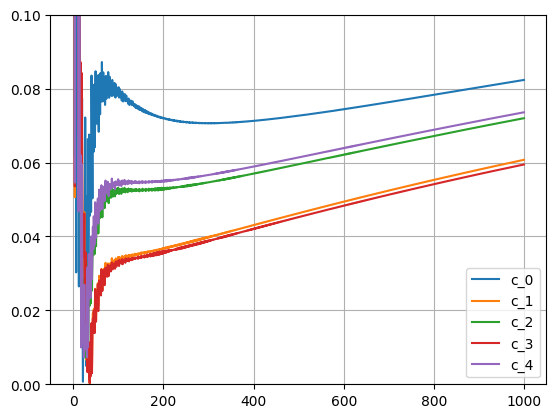

In [ ]:
psnr_values, corr_values = LBM_with_stopping_time_distr_funcs(lenna_gauss, lenna_image, 0.01, 1000)
plot_decorr_distr(corr_values)

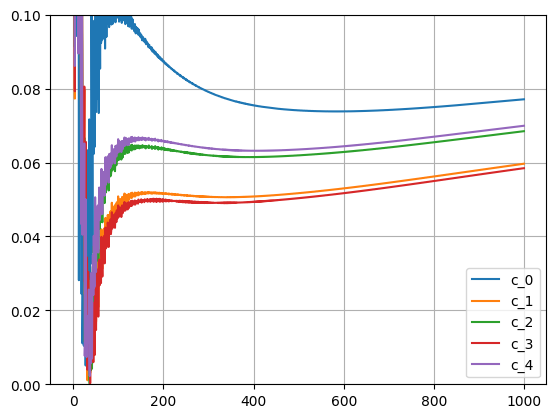

In [ ]:
psnr_values, corr_values = LBM_with_stopping_time_distr_funcs(lenna_sp, lenna_image, 0.01, 1000)
plot_decorr_distr(corr_values)

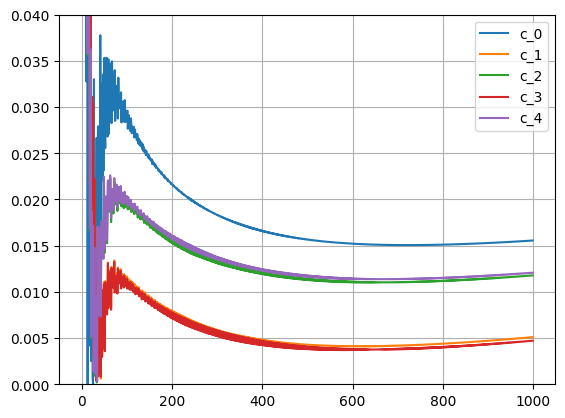

In [ ]:
psnr_values, corr_values = LBM_with_stopping_time_distr_funcs(bigrad_gauss, bigrad_image, 0.01, 1000)
plot_decorr_distr(corr_values, 0.04)

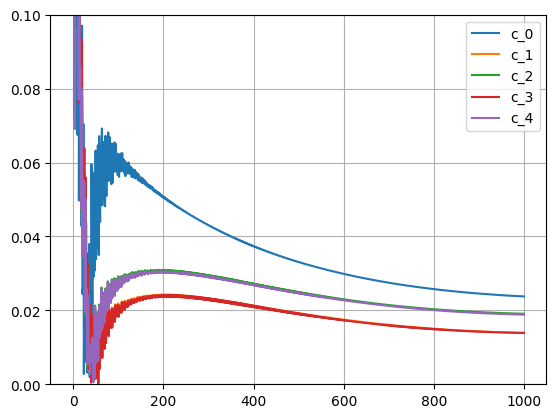

In [ ]:
psnr_values, corr_values = LBM_with_stopping_time_distr_funcs(bigrad_sp, bigrad_image, 0.01, 1000)
plot_decorr_distr(corr_values, 0.1)

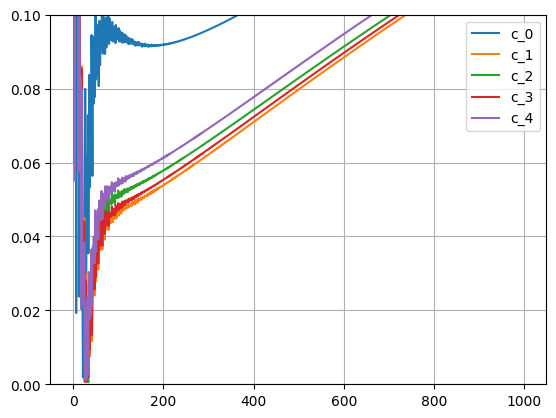

In [ ]:
psnr_values, corr_values = LBM_with_stopping_time_distr_funcs(rice_gauss, rice_image, 0.01, 1000)
plot_decorr_distr(corr_values, 0.1)

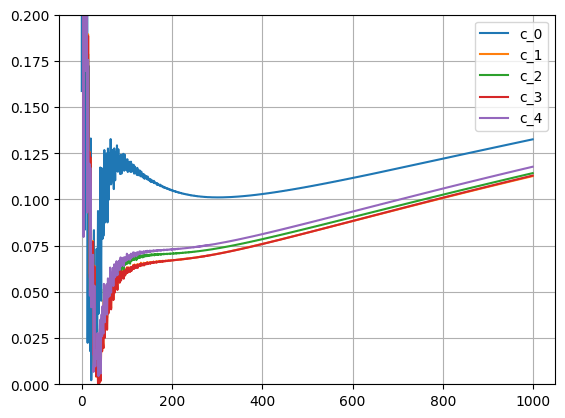

In [ ]:
psnr_values, corr_values = LBM_with_stopping_time_distr_funcs(rice_sp, rice_image, 0.01, 1000)
plot_decorr_distr(corr_values, 0.2)

# If var(noise) is known

If we know the variance of the noise, we can estimate the variance at each step of the LBM algorithm as:

$$
\text{var}(\text{noise}) ≃ \text{var}(u(t) - u(0))
$$

When on the iteration of the LBM algorithm, the estimation of the noise variance u(t) - u(0) becomes exactly equal to the known variance, it will indicate the termination of the algorithm.

In [ ]:
def LBM_varnoise(noisy_image, original_image, dt, num_steps):
    # D2Q5
    alpha_i = np.array([[1/5, 1/5, 1/5, 1/5, 1/5]])
    beta = 2
    gamma = 2.5

    # Initilization
    u = np.expand_dims(noisy_image, 2)
    u_0 = np.copy(u)
    u_eq_i = u*alpha_i
    u_i = np.copy(u_eq_i)

    psnr_values = [psnr(noisy_image, original_image)]
    var_values = []

    for step in range(num_steps):

        # Compute current gradient and tau
        grad_u = compute_gradient(u, beta)
        tau = compute_tau(grad_u, gamma, dt)

        # Collision
        post_col = u_i - (u_i - u_eq_i)/tau

        # Stream
        # indices denote [y_coordinate, x_coordinate, ith_component]
        u_i[:,:,0] = post_col[:,:,0]
        u_i[:,1:,1] = post_col[:,:-1,1]
        u_i[:-1,:,2] = post_col[1:,:,2]
        u_i[:,:-1,3] = post_col[:,1:,3]
        u_i[1:,:,4] = post_col[:-1,:,4]

        # Boundary treatment for inward-facing distributions
        u_i[:,0,1] = post_col[:,0,1]
        u_i[-1,:,2] = post_col[-1,:,2]
        u_i[:,-1,3] = post_col[:,-1,3]
        u_i[0,:,4] = post_col[0,:,4]

        # New u and u_eq_i
        u = np.sum(u_i, axis=2, keepdims=True)
        u_eq_i = u*alpha_i

        # PSNR values
        psnr_values.append(psnr(np.clip(u[:,:,0], 0, 1), original_image))

        # var values
        var_values.append(np.var(u-u_0))

    return psnr_values, var_values

In [ ]:
psnr_values, var_values = LBM_varnoise(lenna_gauss, lenna_image, 0.02, 500)

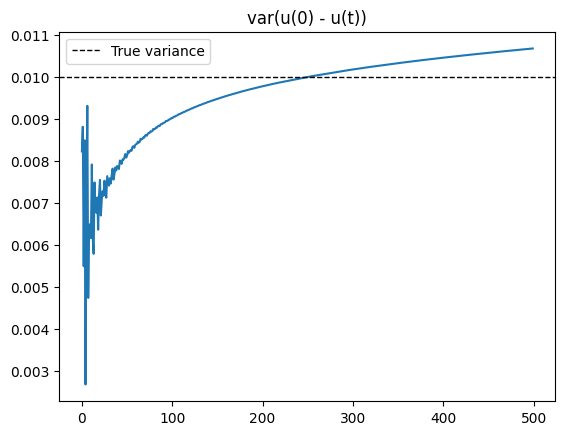

In [ ]:
plt.plot(var_values)
plt.axhline(0.01, color = 'k', linewidth = 1, linestyle ="--", label='True variance')
plt.title('var(u(0) - u(t))')
plt.legend();

In [ ]:
psnr_values, var_values = LBM_varnoise(rice_gauss, rice_image, 0.02, 500)

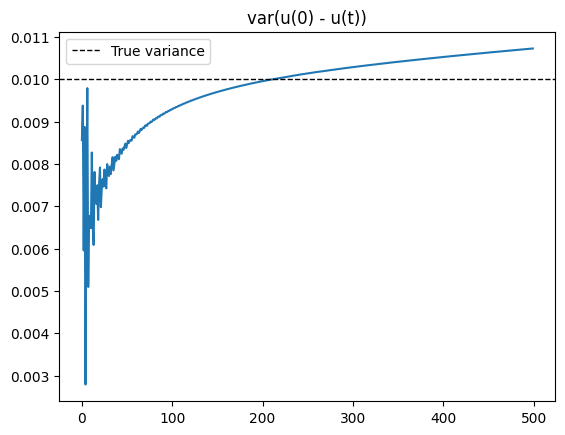

In [ ]:
plt.plot(var_values)
plt.axhline(0.01, color = 'k', linewidth = 1, linestyle ="--", label='True variance')
plt.title('var(u(0) - u(t))')
plt.legend();

In [ ]:
psnr_values, var_values = LBM_varnoise(bigrad_gauss, bigrad_image, 0.02, 1000)

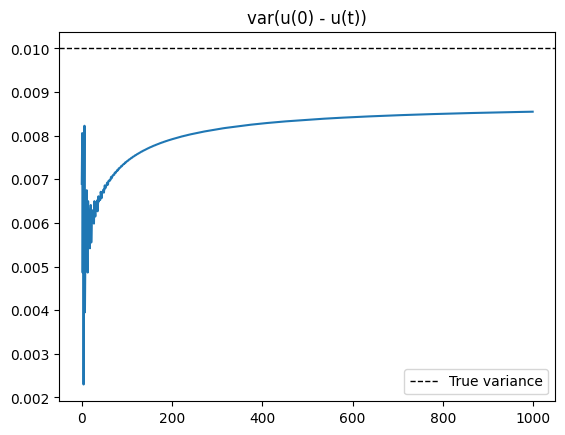

In [ ]:
plt.plot(var_values)
plt.axhline(0.01, color = 'k', linewidth = 1, linestyle ="--", label='True variance')
plt.title('var(u(0) - u(t))')
plt.legend();

So this criterion doesn't always work.

# Entropy

Let's consider entropy value at each step:

$$
H(t) = \int \sum_{i} (u_i \log u_i) dx
$$

$$
\frac{\partial H(t)}{\partial t} = \int \sum_{i}\left(\frac{\partial u_i}{\partial t} \log u_i\right) dx  +
\int \sum_{i}\left(\frac{\partial u_i}{\partial t}\right) dx = \int \frac{1}{\tau}  \sum_{i}\left( (u_i^{\text{(eq)}} - u_i) \cdot \log u_i \right) dx
$$

In [ ]:
def entropy(u_i):
    return np.sum(u_i*np.log(u_i))

In [ ]:
def d_entropy(u_i, u_eq_i, tau):
    return np.sum(np.log(u_i)*(u_eq_i-u_i)/tau)

In [ ]:
def LBM_with_stopping_time_entropy(noisy_image, original_image, dt, num_steps):
    # D2Q5
    alpha_i = np.array([[1/5, 1/5, 1/5, 1/5, 1/5]])
    beta = 2
    gamma = 2.5

    # Initilization
    u = np.expand_dims(noisy_image, 2)
    u_eq_i = u*alpha_i
    u_i = np.copy(u_eq_i)

    psnr_values = [psnr(noisy_image, original_image)]
    entropy_values = []
    d_entropy_values = []
    relative_entropy = []

    for step in range(num_steps):

        # Compute current gradient and tau
        grad_u = compute_gradient(u, beta)
        tau = compute_tau(grad_u, gamma, dt)

        # Collision
        post_col = u_i - (u_i - u_eq_i)/tau

        # Stream
        # indices denote [y_coordinate, x_coordinate, ith_component]
        u_i[:,:,0] = post_col[:,:,0]
        u_i[:,1:,1] = post_col[:,:-1,1]
        u_i[:-1,:,2] = post_col[1:,:,2]
        u_i[:,:-1,3] = post_col[:,1:,3]
        u_i[1:,:,4] = post_col[:-1,:,4]

        # Boundary treatment for inward-facing distributions
        u_i[:,0,1] = post_col[:,0,1]
        u_i[-1,:,2] = post_col[-1,:,2]
        u_i[:,-1,3] = post_col[:,-1,3]
        u_i[0,:,4] = post_col[0,:,4]

        # New u and u_eq_i
        u = np.sum(u_i, axis=2, keepdims=True)
        u_eq_i = u*alpha_i

        # PSNR values
        psnr_values.append(psnr(np.clip(u[:,:,0], 0, 1), original_image))

        # entropy
        entropy_values.append(entropy(u_i))
        d_entropy_values.append(d_entropy(u_i, u_eq_i, tau))
        relative_entropy.append(d_entropy(u_i, u_eq_i, tau)/entropy(u_i))

    return psnr_values, entropy_values, d_entropy_values, relative_entropy

In [ ]:
psnr_values, entropy_values, d_entropy_values, relative_entropy = LBM_with_stopping_time_entropy(lenna_gauss, lenna_image, 0.05, 200)

<ipython-input-29-da8453a0f8f2>:2: RuntimeWarning: divide by zero encountered in log
  return np.sum(u_i*np.log(u_i))
<ipython-input-29-da8453a0f8f2>:2: RuntimeWarning: invalid value encountered in multiply
  return np.sum(u_i*np.log(u_i))
<ipython-input-29-da8453a0f8f2>:2: RuntimeWarning: invalid value encountered in log
  return np.sum(u_i*np.log(u_i))


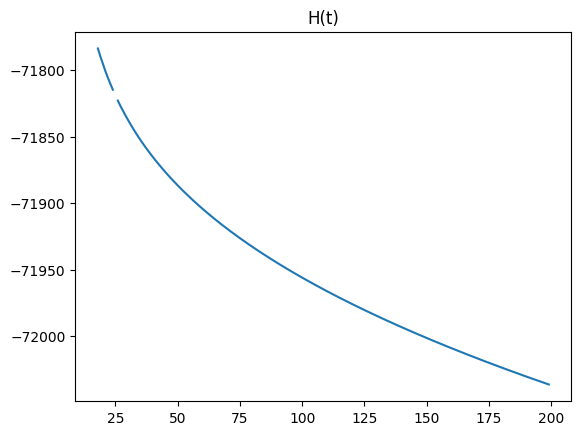

In [ ]:
plt.plot(entropy_values)
plt.title('H(t)');

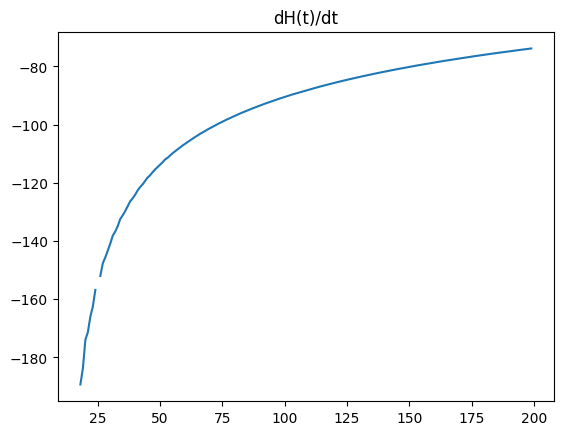

In [ ]:
plt.plot(d_entropy_values)
plt.title('dH(t)/dt');

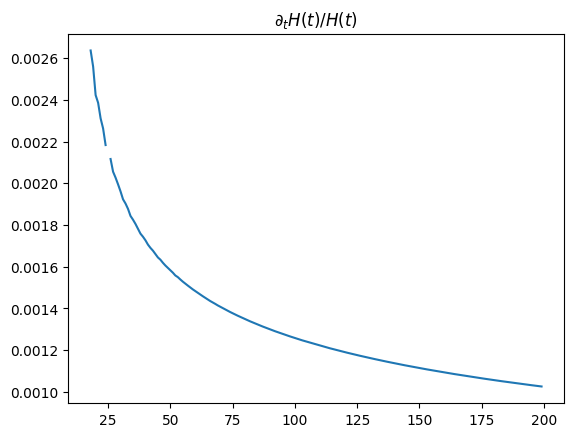

In [ ]:
plt.plot(relative_entropy)
plt.title(r'$\partial_t H(t)/H(t)$');

# Entropy 2

Another method of determining entropy:

$$
H(t) = \int dx \left(\sum_{i} u_i \right) \log \left(\sum_{i} u_i\right)
$$

$$
\frac{\partial H(t)}{\partial t} =
\int \left(\sum_{i} \frac{\partial u_i}{\partial t} \right) \log \left(\sum_{i} u_i\right) dx +
\int \sum_{i}\frac{\partial u_i}{\partial t} dx
$$

In [ ]:
def entropy2(u):
    return np.sum(-u*np.log(u + 1e-5))

In [ ]:
def LBM_with_stopping_time_entropy2(noisy_image, original_image, dt, num_steps):
    # D2Q5
    alpha_i = np.array([[1/5, 1/5, 1/5, 1/5, 1/5]])
    beta = 2
    gamma = 2.5

    # Initilization
    u = np.expand_dims(noisy_image, 2)
    u_eq_i = u*alpha_i
    u_i = np.copy(u_eq_i)

    psnr_values = [psnr(noisy_image, original_image)]
    entropy_values = []
    d_entropy_values = []
    relative_entropy = []

    for step in range(num_steps):

        # Compute current gradient and tau
        grad_u = compute_gradient(u, beta)
        tau = compute_tau(grad_u, gamma, dt)

        # Collision
        post_col = u_i - (u_i - u_eq_i)/tau

        # Stream
        # indices denote [y_coordinate, x_coordinate, ith_component]
        u_i[:,:,0] = post_col[:,:,0]
        u_i[:,1:,1] = post_col[:,:-1,1]
        u_i[:-1,:,2] = post_col[1:,:,2]
        u_i[:,:-1,3] = post_col[:,1:,3]
        u_i[1:,:,4] = post_col[:-1,:,4]

        # Boundary treatment for inward-facing distributions
        u_i[:,0,1] = post_col[:,0,1]
        u_i[-1,:,2] = post_col[-1,:,2]
        u_i[:,-1,3] = post_col[:,-1,3]
        u_i[0,:,4] = post_col[0,:,4]

        # New u and u_eq_i
        u = np.sum(u_i, axis=2, keepdims=True)
        u_eq_i = u*alpha_i

        # PSNR values
        psnr_values.append(psnr(np.clip(u[:,:,0], 0, 1), original_image))

        # entropy
        entropy_values.append(entropy2(np.clip(u[:,:,0], 0, 1)))

    return psnr_values, entropy_values

In [ ]:
psnr_values, entropy_values = LBM_with_stopping_time_entropy2(lenna_gauss, lenna_image, 0.05, 200)

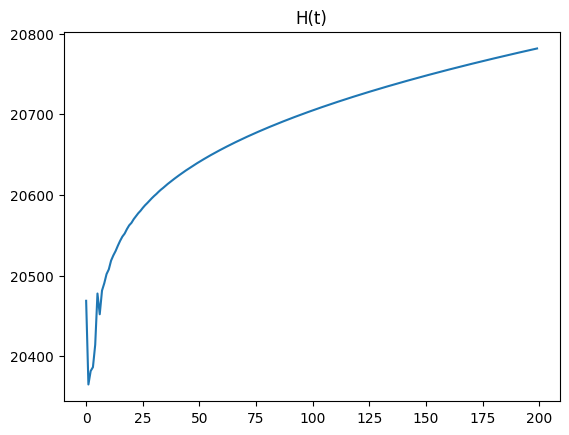

In [ ]:
plt.plot(entropy_values)
plt.title('H(t)');

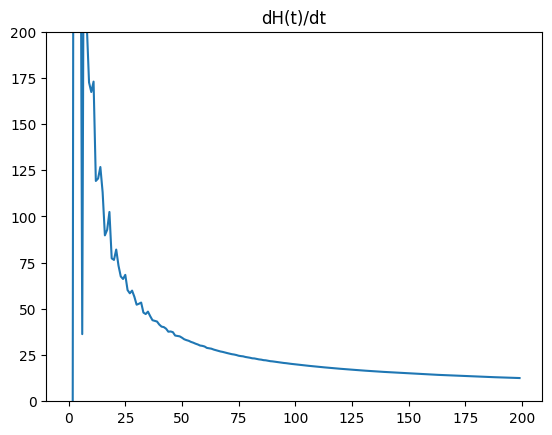

In [ ]:
plt.plot(np.gradient(entropy_values, 0.05))
plt.ylim((0,200))
plt.title('dH(t)/dt');

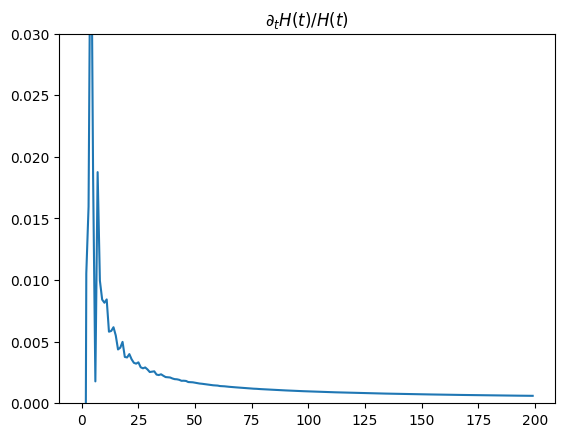

In [ ]:
plt.plot(np.gradient(entropy_values, 0.05)/np.array(entropy_values))
plt.ylim((0,0.03))
plt.title(r'$\partial_t H(t)/H(t)$');

# A value

A turning point in the value of A may indicate the termination of the algorithm:

$$
A = \int dx \sum_i \left| \frac{u_i - u_i^{r}}{u_i^{r}} \right|
$$

In [ ]:
def A_value(u_i, u_eq_i, tau, dt):
    u_reg = u_eq_i - tau*np.sum(compute_gradient(u_eq_i, 2), axis=2, keepdims=True)
    return np.sum(np.abs((u_i-u_reg)/u_reg))

In [ ]:
def LBM_with_stopping_time_a_value(noisy_image, original_image, dt, num_steps):
    # D2Q5
    alpha_i = np.array([[1/5, 1/5, 1/5, 1/5, 1/5]])
    beta = 2
    gamma = 2.5

    # Initilization
    u = np.expand_dims(noisy_image, 2)
    u_eq_i = u*alpha_i
    u_i = np.copy(u_eq_i)

    psnr_values = [psnr(noisy_image, original_image)]
    a_values = []

    for step in range(num_steps):

        # Compute current gradient and tau
        grad_u = compute_gradient(u, beta)
        tau = compute_tau(grad_u, gamma, dt)

        # print(tau.shape)
        # print(np.sum(compute_gradient(u_eq_i, 2), axis=2).shape)

        # Collision
        post_col = u_i - (u_i - u_eq_i)/tau

        # Stream
        # indices denote [y_coordinate, x_coordinate, ith_component]
        u_i[:,:,0] = post_col[:,:,0]
        u_i[:,1:,1] = post_col[:,:-1,1]
        u_i[:-1,:,2] = post_col[1:,:,2]
        u_i[:,:-1,3] = post_col[:,1:,3]
        u_i[1:,:,4] = post_col[:-1,:,4]

        # Boundary treatment for inward-facing distributions
        u_i[:,0,1] = post_col[:,0,1]
        u_i[-1,:,2] = post_col[-1,:,2]
        u_i[:,-1,3] = post_col[:,-1,3]
        u_i[0,:,4] = post_col[0,:,4]

        # New u and u_eq_i
        u = np.sum(u_i, axis=2, keepdims=True)
        u_eq_i = u*alpha_i

        # PSNR values
        psnr_values.append(psnr(np.clip(u[:,:,0], 0, 1), original_image))

        # a_values
        a_values.append(A_value(u_i, u_eq_i, tau, dt))

    return psnr_values, a_values

In [ ]:
psnr_values, a_values = LBM_with_stopping_time_a_value(lenna_gauss, lenna_image, 0.02, 500)

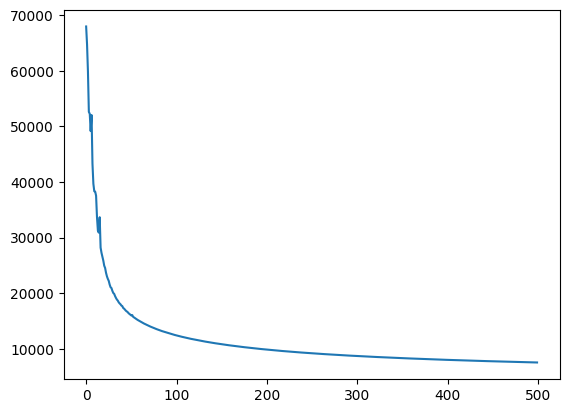

In [ ]:
plt.plot(a_values);

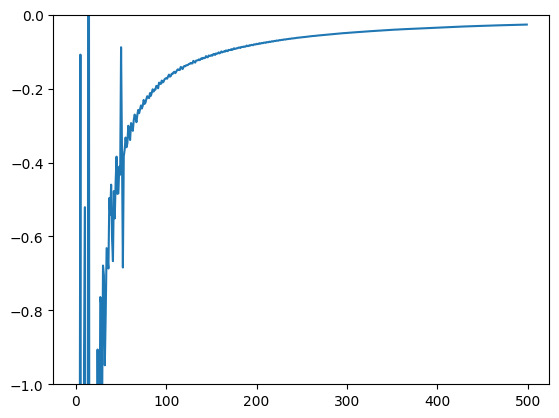

In [ ]:
plt.plot(np.gradient(a_values, 0.02)/np.array(a_values))
plt.ylim((-1,0));

# BSD68

To determine the effectiveness of the LBM model with the decorrelation criterion for stopping, let's consider filtering on the BSD68 test dataset with $\sigma = 20$.

https://github.com/lpj0/MWCNN/tree/master/testsets/BSD68

In [24]:
import numpy as np
import os

original_images = []
curren_dir = os.getcwd()

for imagename in sorted(os.listdir(curren_dir + '/BSD68_testset')):
    if imagename.endswith('.png'):
        pil_image = Image.open(curren_dir + '/BSD68_testset/' + imagename)
        original_images.append(np.asarray(pil_image.convert("L"))/255)

In [28]:
noisy_images = []

for image in original_images:
    noisy_images.append(add_gauss_noise(image, sigma=20/255))

The algorithm stops when the decorrelation criterion is met; otherwise, it stops after 700 steps.

In [29]:
from scipy.signal import argrelextrema

optimal_t = []
decorr_t = []
psnr_optimal = []
psnr_decorr = []

for i in range(len(noisy_images)):
    psnr_values, corr_values = LBM_with_stopping_time(noisy_images[i], original_images[i], 0.01, 700)

    optimal_t.append(np.argmax(psnr_values))
    psnr_optimal.append(np.max(psnr_values))

    t = argrelextrema(np.array(corr_values), np.less_equal, order=20)[0][-1]
    print(f"{i}, Local minima:", argrelextrema(np.array(corr_values), np.less_equal, order=20)[0],
          ", PSNR_corr:", round(psnr_values[t], 2),
          "  ||  Optimal T:", np.argmax(psnr_values),
          ", PSNR_opt:", round(np.max(psnr_values),2)
          )
    decorr_t.append(t)
    psnr_decorr.append(psnr_values[t])

0, Local minima: [  0 700] , PSNR_corr: 22.7   ||  Optimal T: 36 , PSNR_opt: 25.03
1, Local minima: [  0 700] , PSNR_corr: 27.28   ||  Optimal T: 133 , PSNR_opt: 27.94
2, Local minima: [  0 676] , PSNR_corr: 26.62   ||  Optimal T: 105 , PSNR_opt: 27.39
3, Local minima: [  0 412] , PSNR_corr: 29.76   ||  Optimal T: 188 , PSNR_opt: 30.11
4, Local minima: [  0 608] , PSNR_corr: 25.1   ||  Optimal T: 50 , PSNR_opt: 26.87
5, Local minima: [  0 595] , PSNR_corr: 31.45   ||  Optimal T: 426 , PSNR_opt: 31.5
6, Local minima: [  0 301] , PSNR_corr: 26.92   ||  Optimal T: 73 , PSNR_opt: 27.98
7, Local minima: [  0 700] , PSNR_corr: 22.62   ||  Optimal T: 36 , PSNR_opt: 25.16
8, Local minima: [  0 392] , PSNR_corr: 27.44   ||  Optimal T: 96 , PSNR_opt: 28.33
9, Local minima: [  0 539] , PSNR_corr: 28.82   ||  Optimal T: 160 , PSNR_opt: 29.44
10, Local minima: [  0 349] , PSNR_corr: 24.32   ||  Optimal T: 50 , PSNR_opt: 25.96
11, Local minima: [  0 638] , PSNR_corr: 26.63   ||  Optimal T: 88 , PSNR

The resulting mean PSNR using the decorrelation criterion is ...

In [31]:
np.mean(psnr_decorr)

26.828291565183267

The optimal PSNR for the LBM algorithm on the BSD68 dataset is ...

In [32]:
np.mean(psnr_optimal)

28.047316681778824